In [2]:
%load_ext autoreload
%autoreload 2

from rumbooster import RUMBooster
import matplotlib.pyplot as plt
import matplotlib
from benchmarks import return_dataset
from datasets import load_preprocess_LPMC, load_preprocess_SwissMetro
import seaborn as sns

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# RUMBoost - Travel time, Cost, Age, All variables

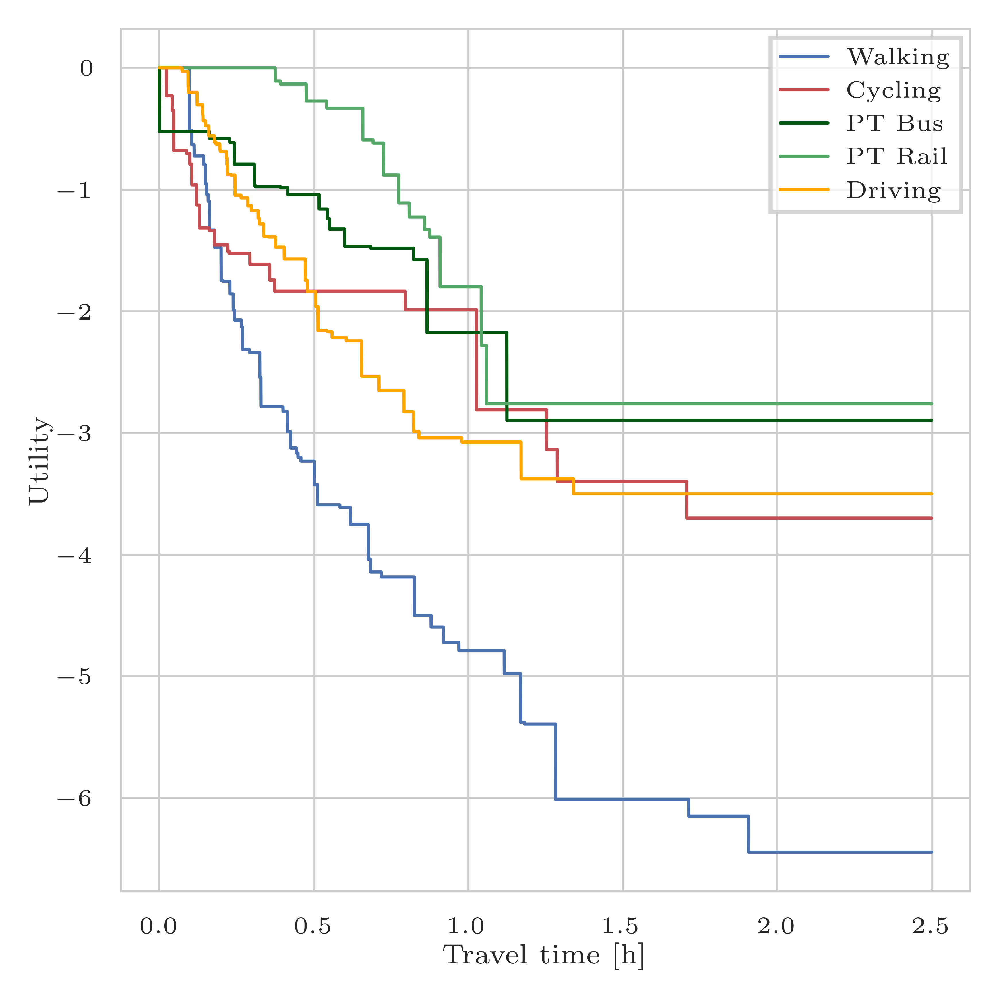

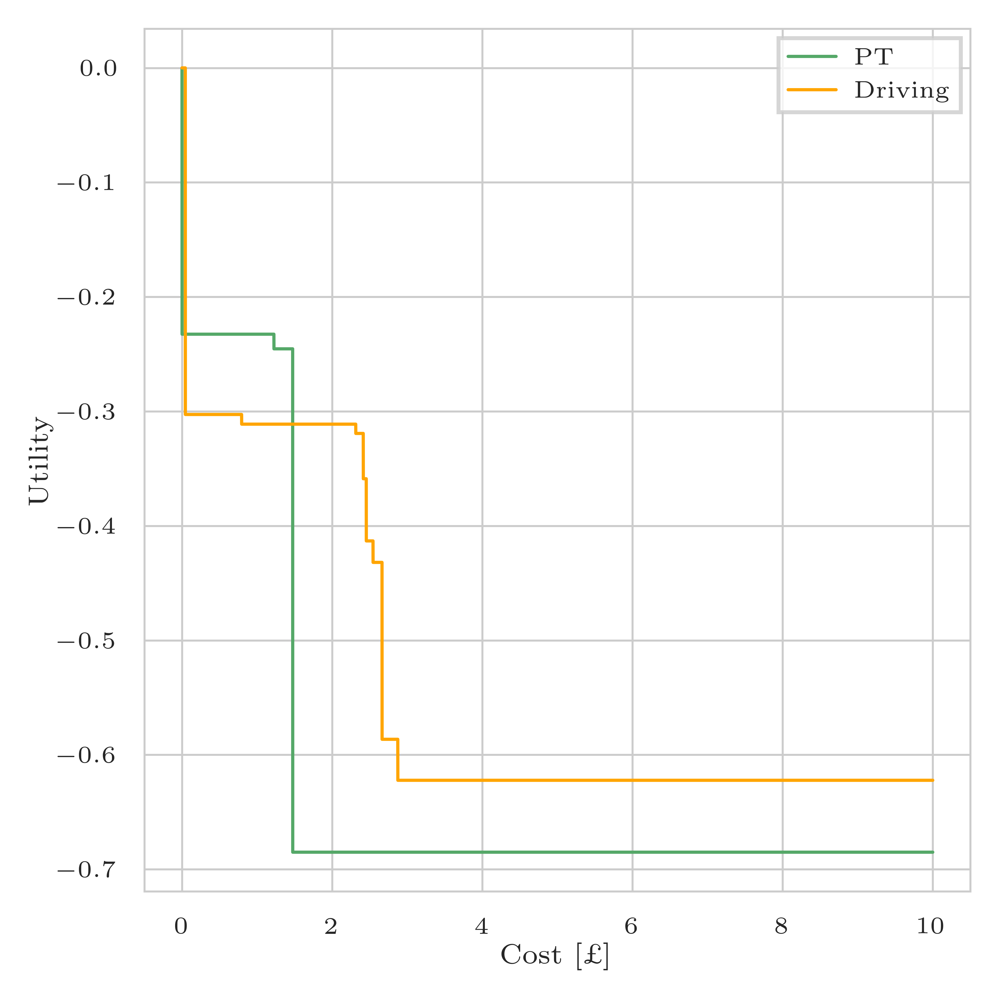

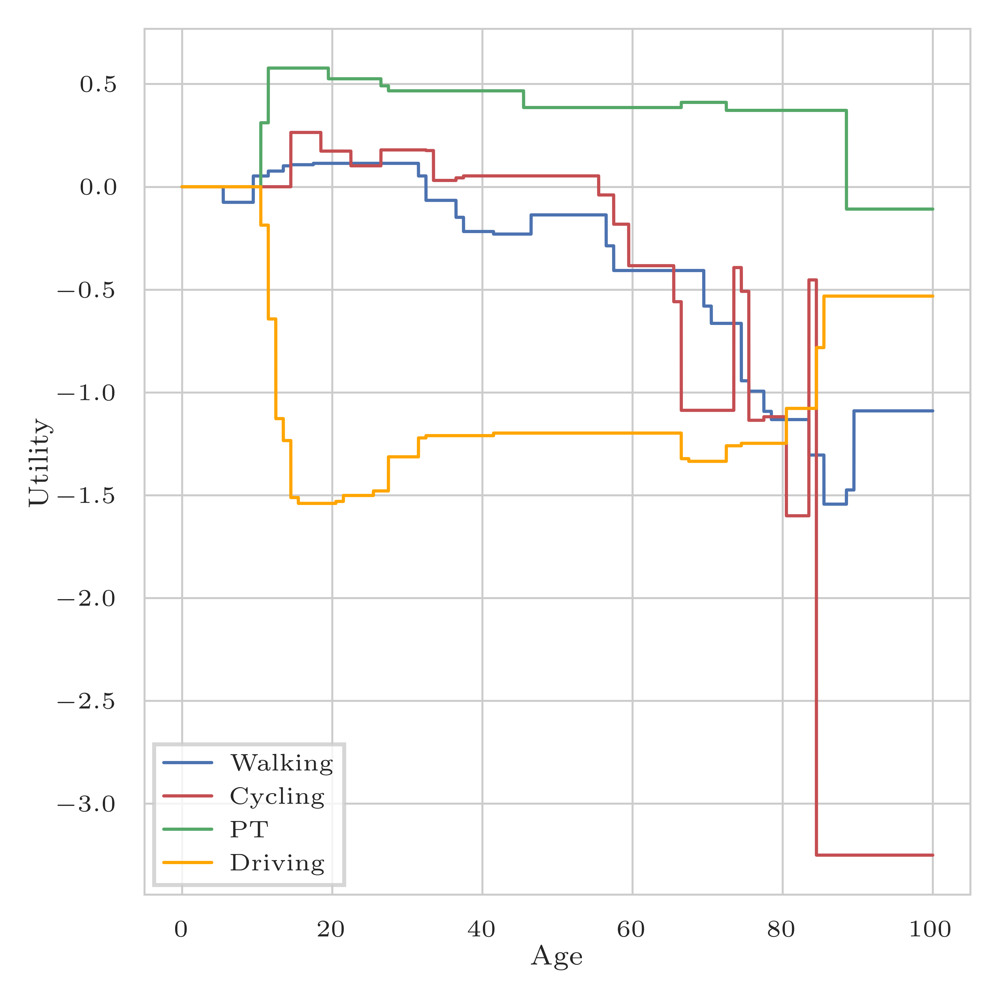

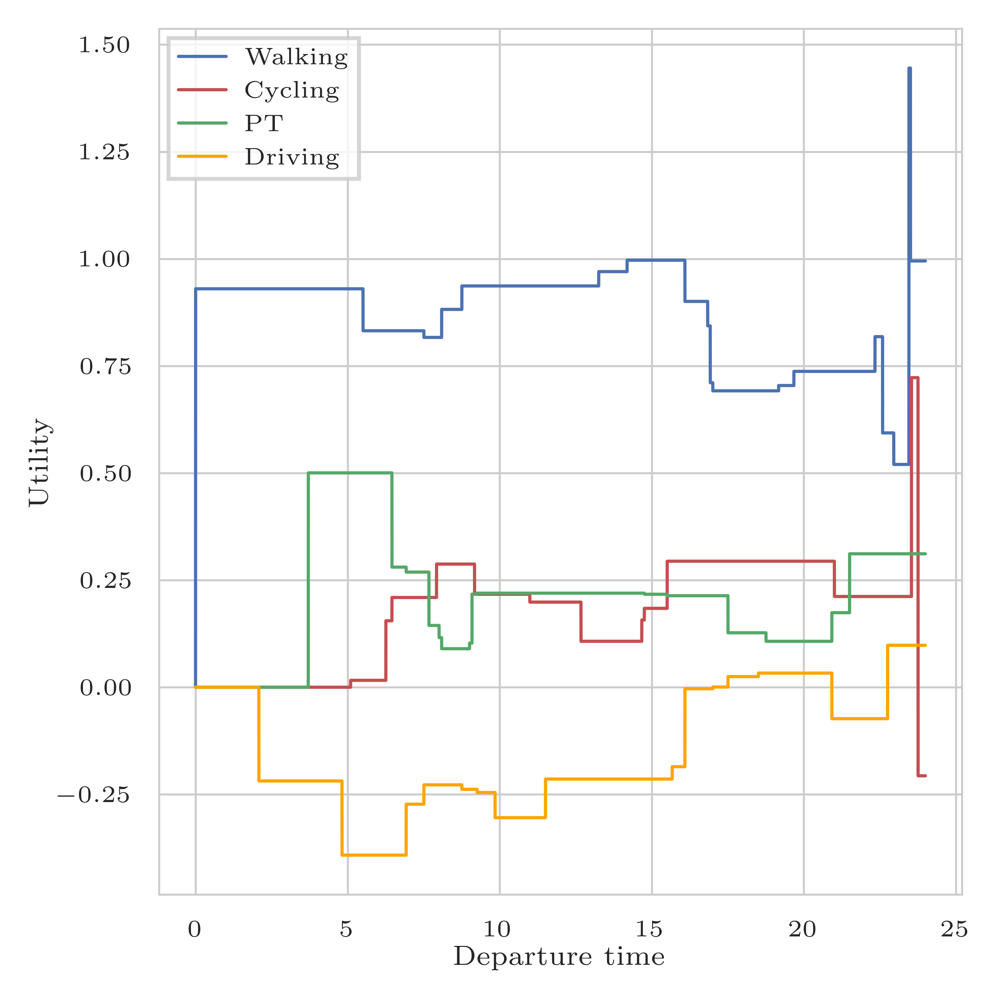

c:\Users\DAF1\OneDrive - University College London\Documents\PhD - UCL\GBM feature extraction\Multiclass problem\rumbooster.py:1487: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.xlabel('{} [h]'.format(f))


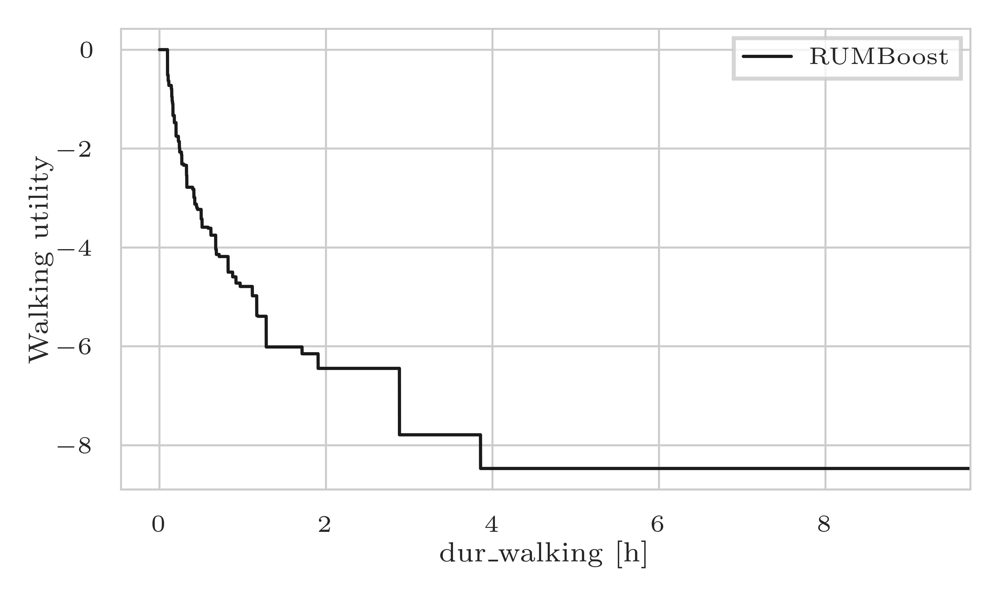

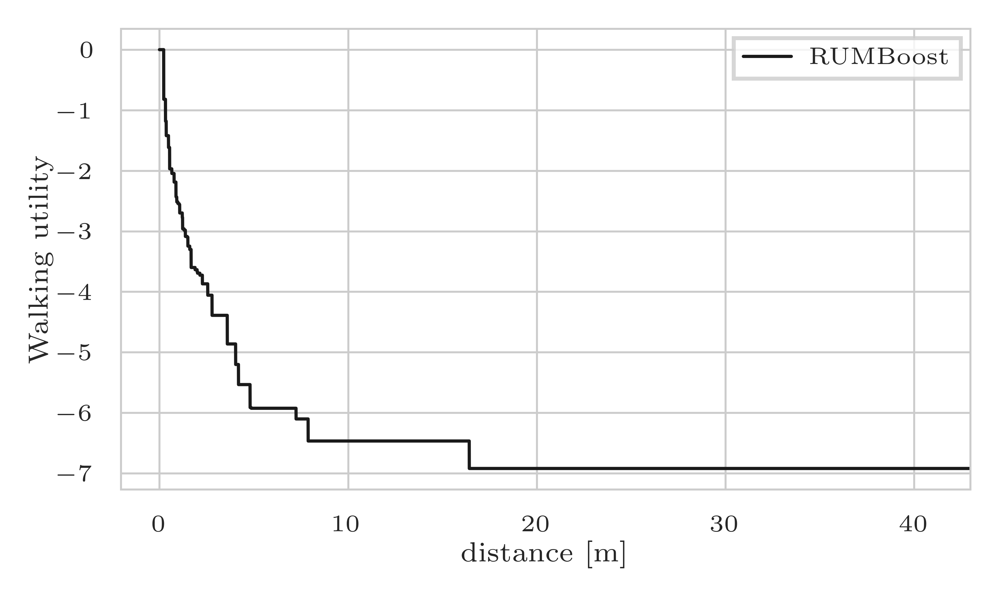

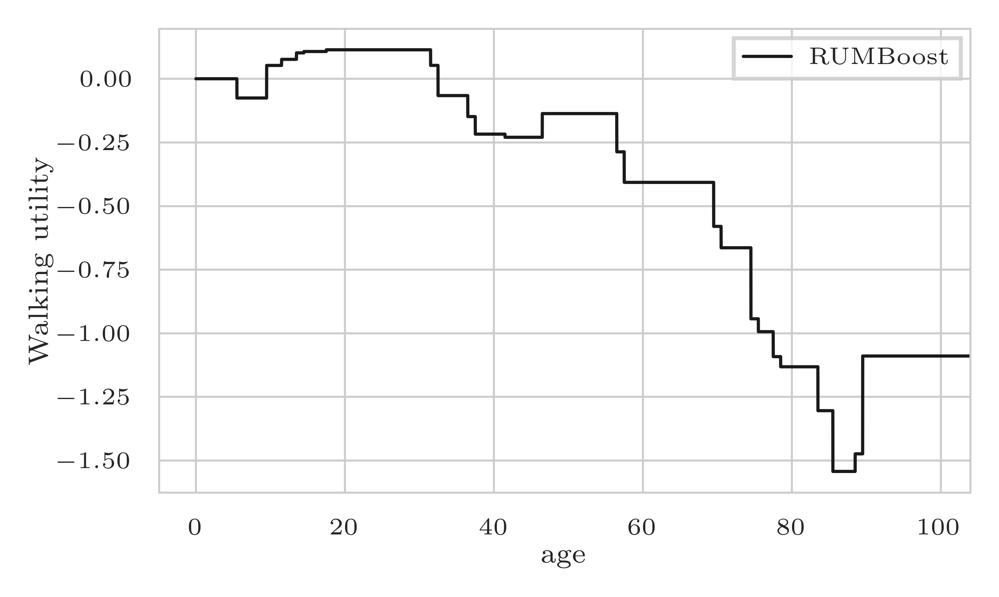

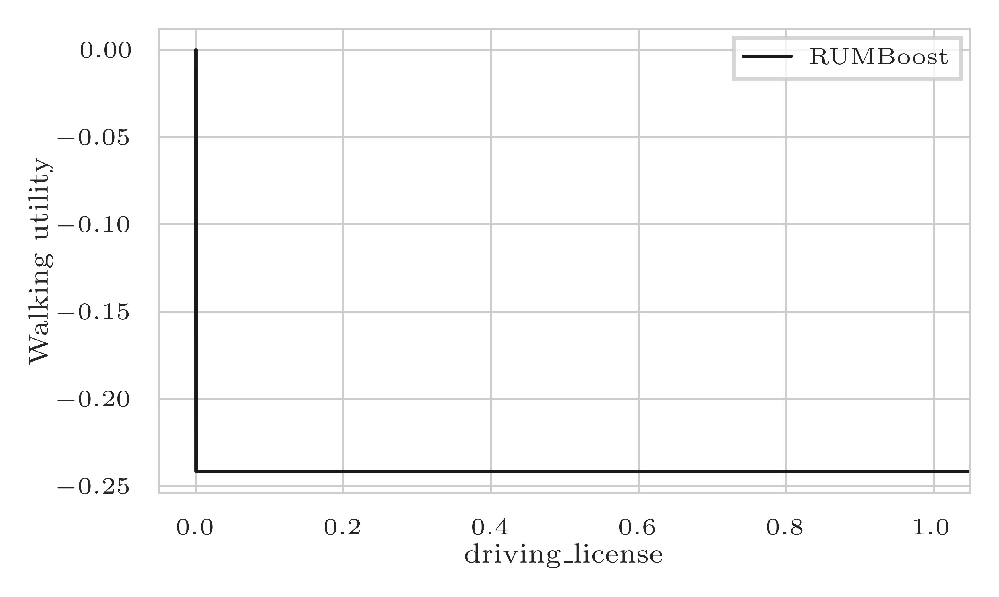

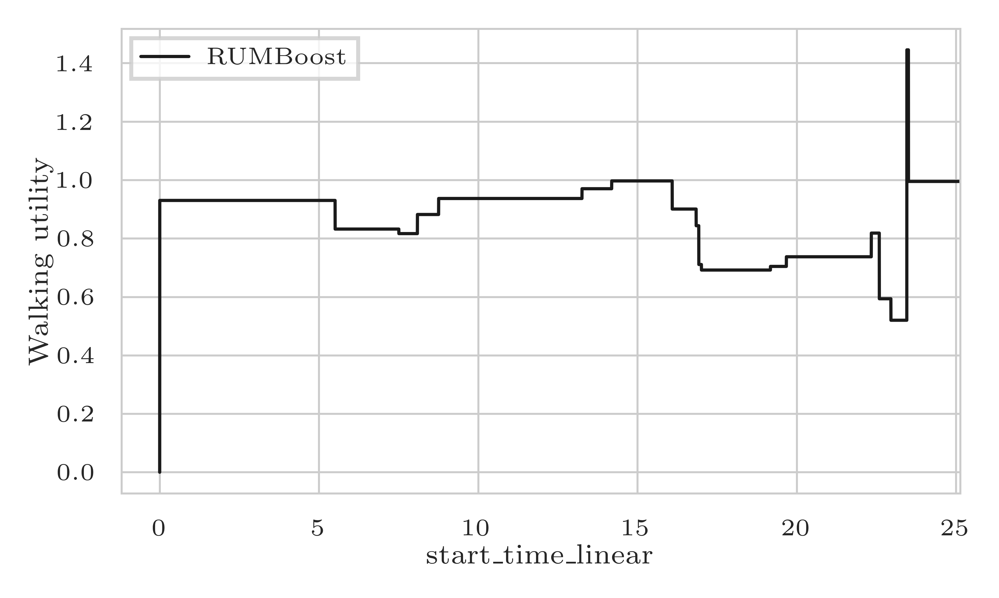

...

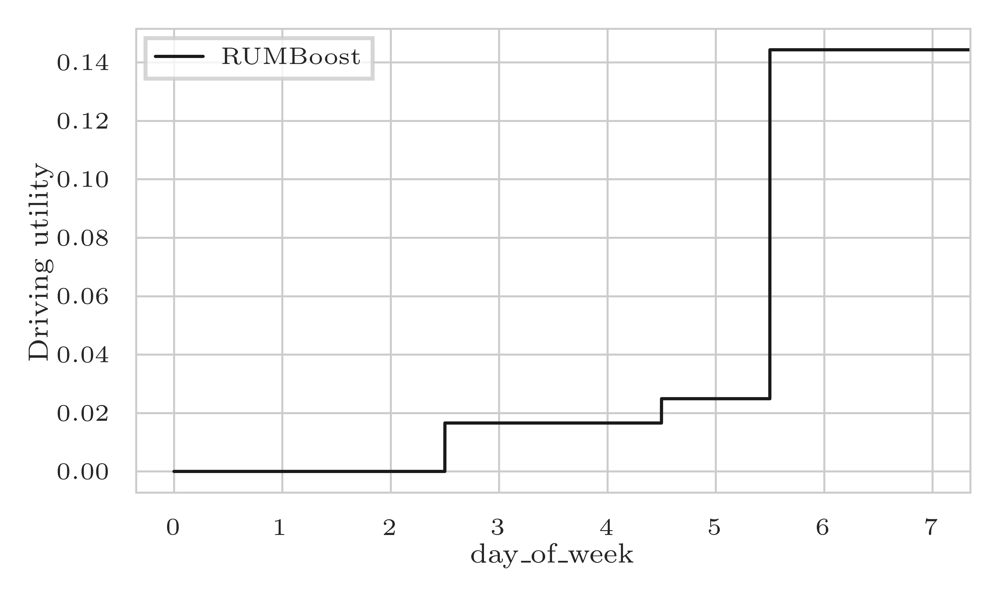

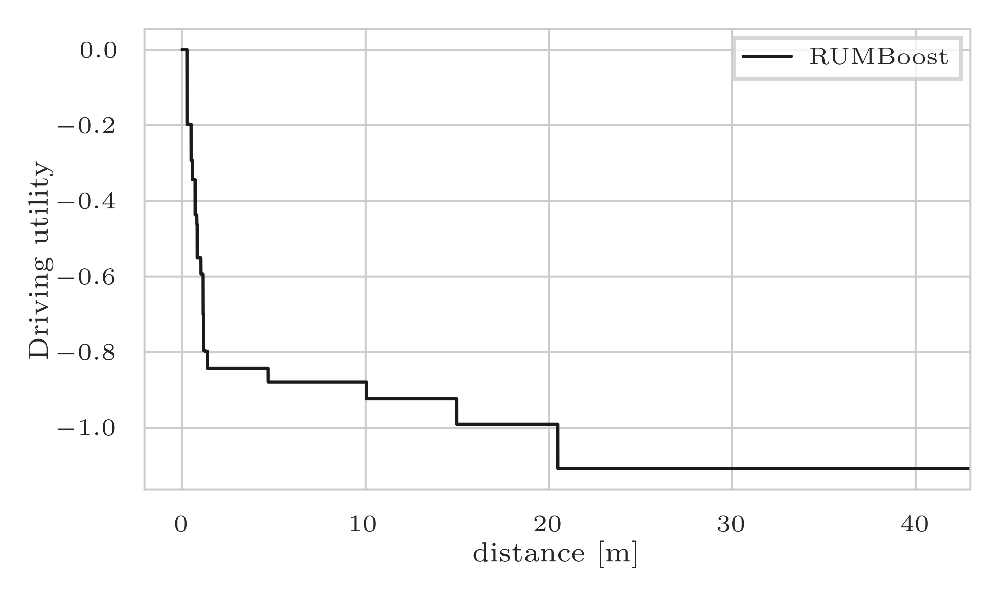

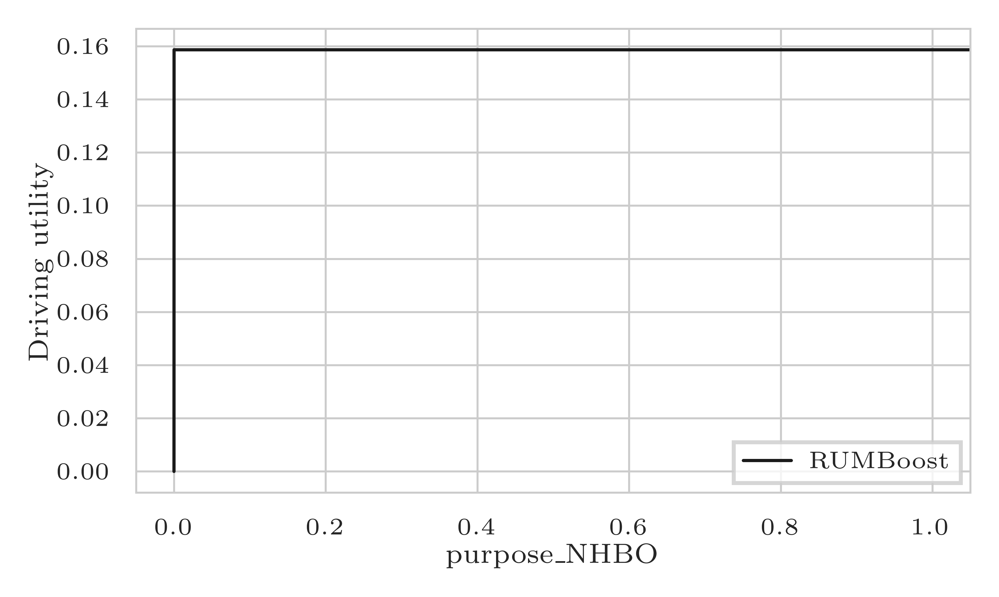

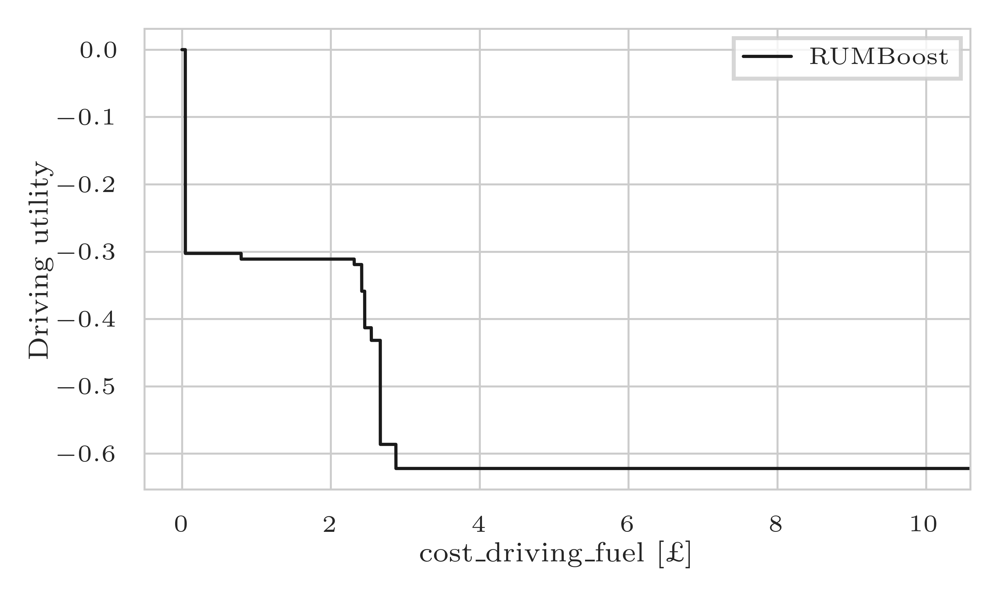

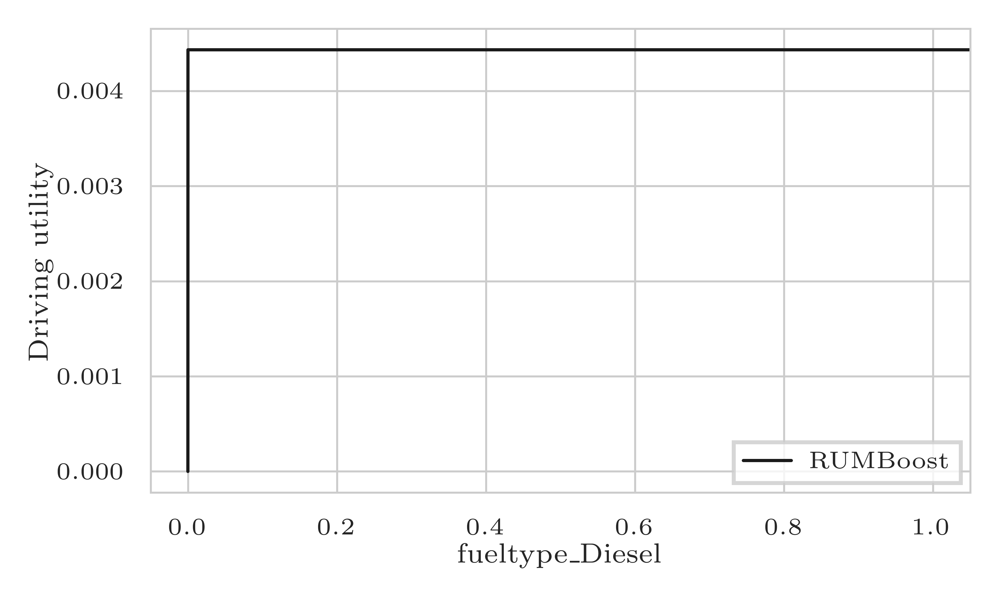

In [147]:
model = RUMBooster(model_file='../Data/Results-RealDatasets/LPMC_RUMBoost.json')
params = {'verbosity': 1,
        'num_classes': 4,
        'learning_rate': 0.1,
        'max_depth': 1,
        'num_boost_round': 2000,
        'objective':'multiclass',
        'early_stopping_rounds': 100,
        'boosting': 'gbdt',
        'monotone_constraints_method': 'advanced'
        }

dataset_train, dataset_test = return_dataset([load_preprocess_LPMC])

#utility_names = {'0':'Train', '1':'Swissmetro', '2':'Car'}
utility_names = {'0':'Walking', '1':'Cycling', '2':'PT', '3':'Driving'}

model.plot_parameters(params = params, X=dataset_train[0], utility_names= utility_names, asc_normalised=True, sm_tt_cost=False, save_figure=True, only_tt=False, only_1d=False, save_file='RUMBoost/LPMC/')

# SwissMetro TT, Cost, All figures

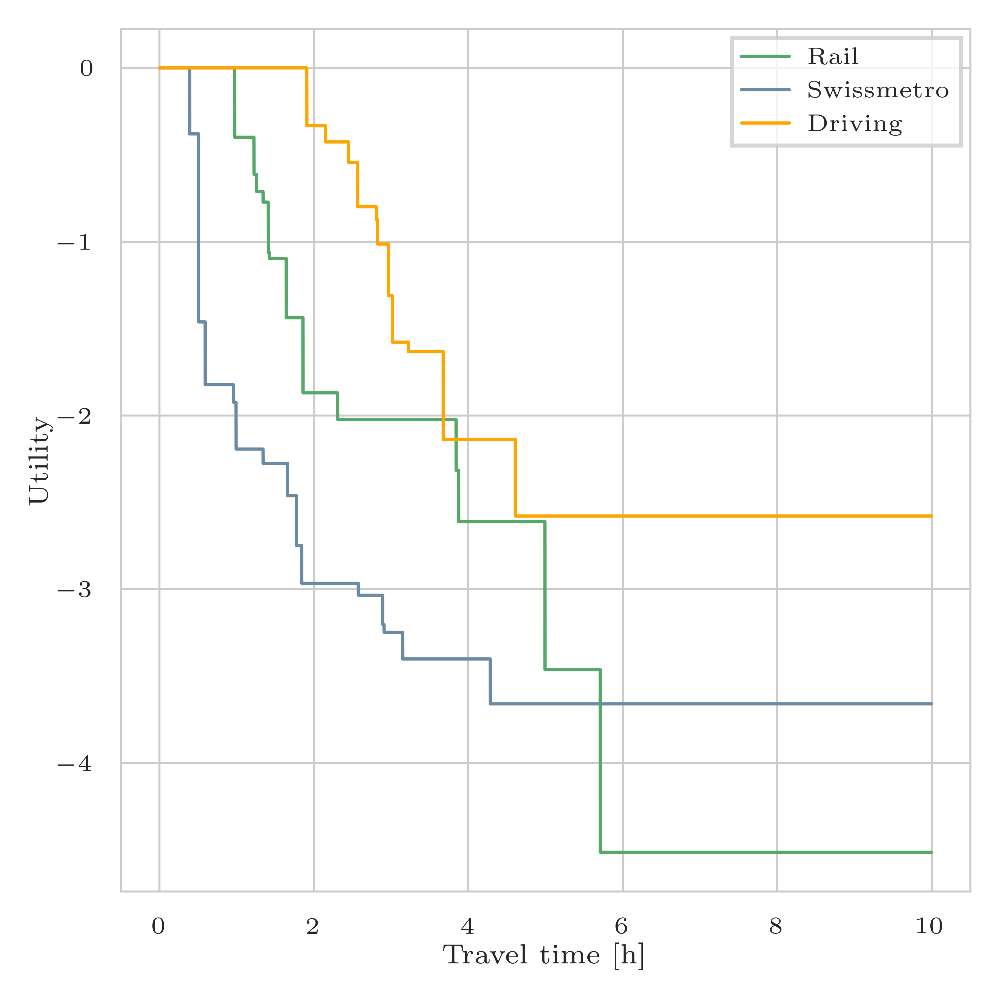

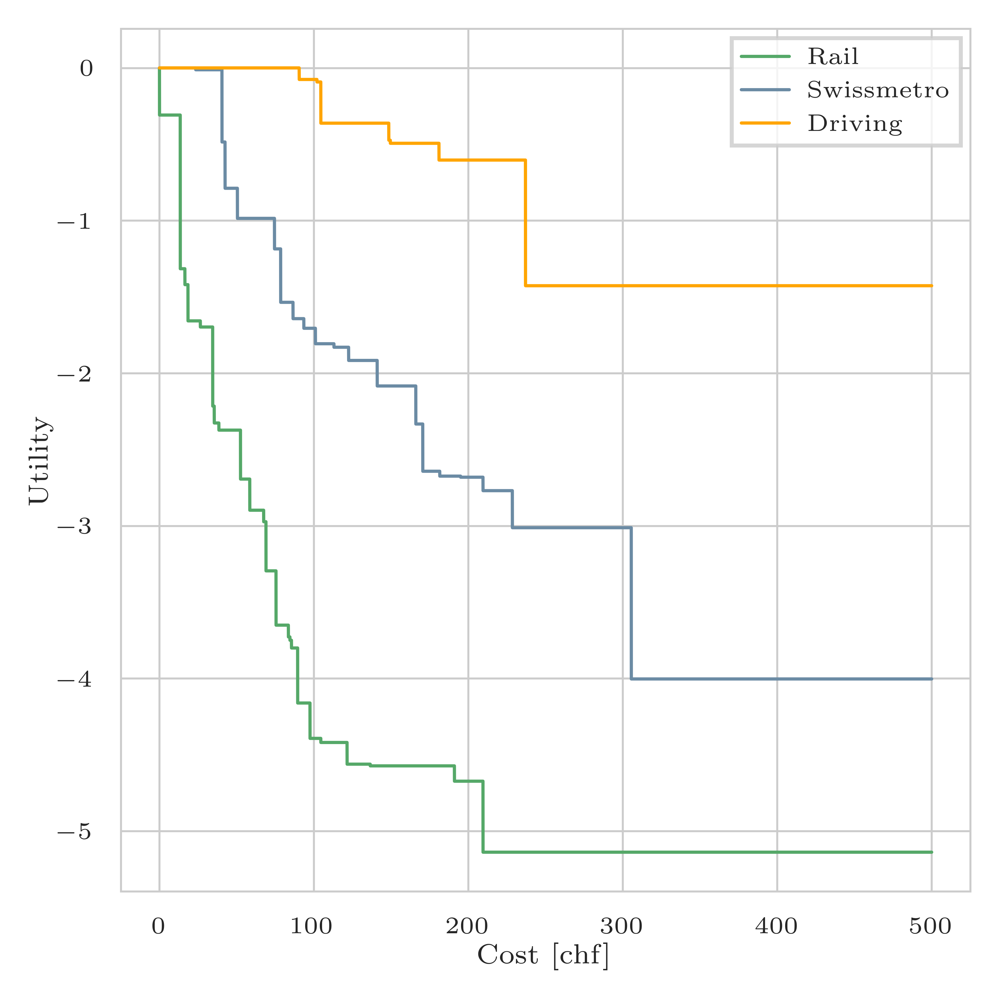

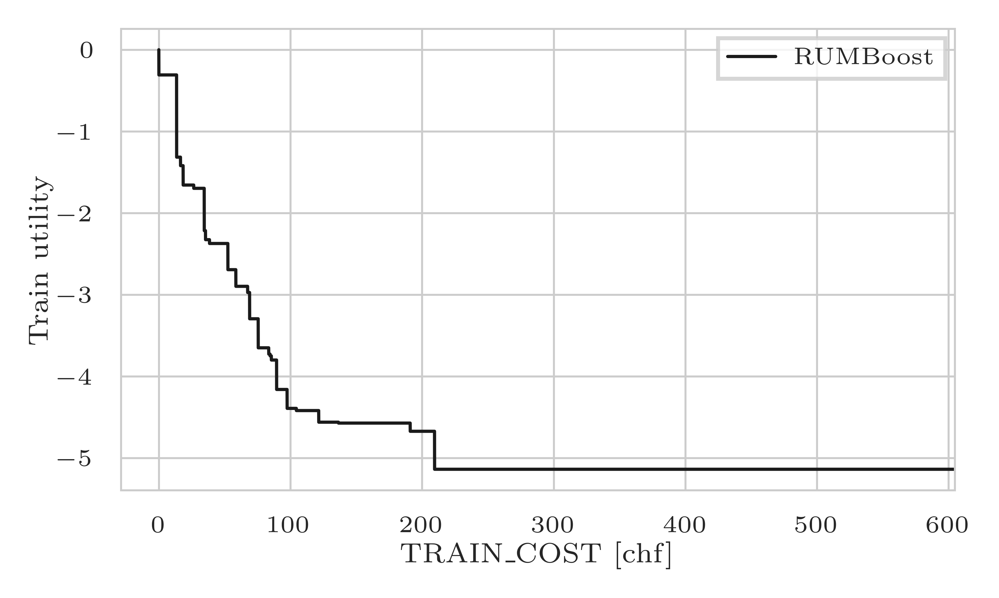

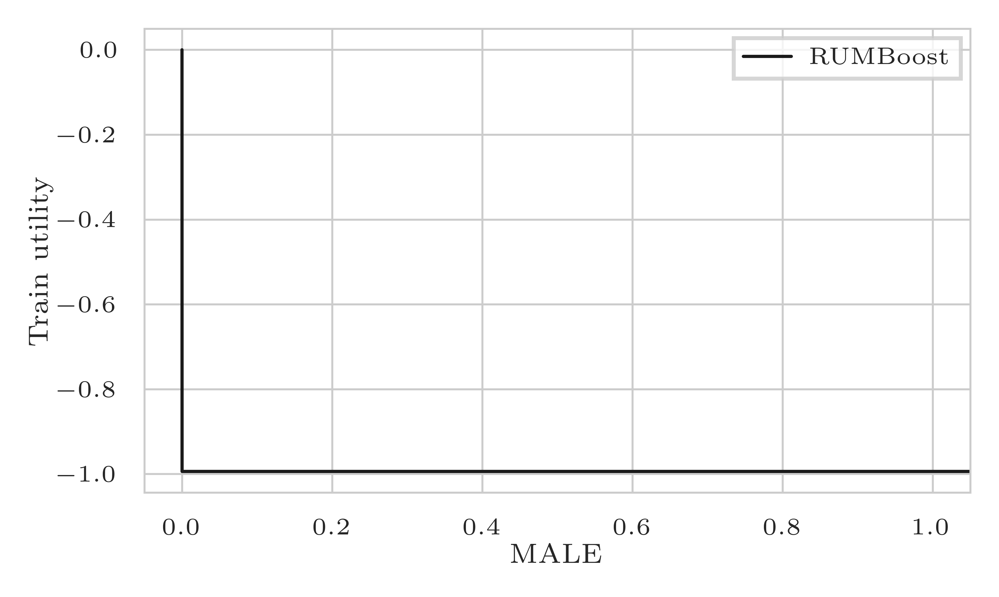

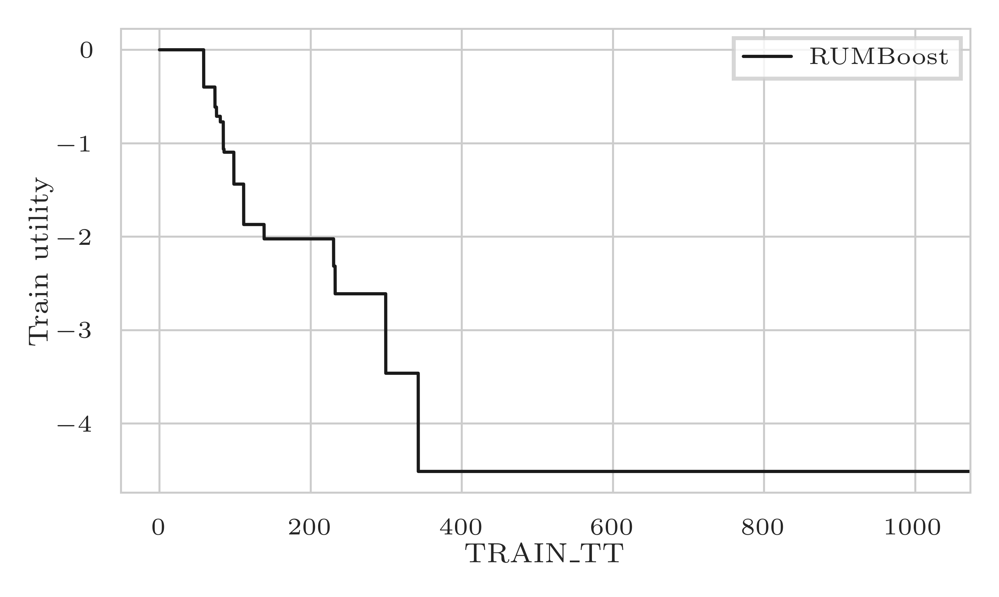

...

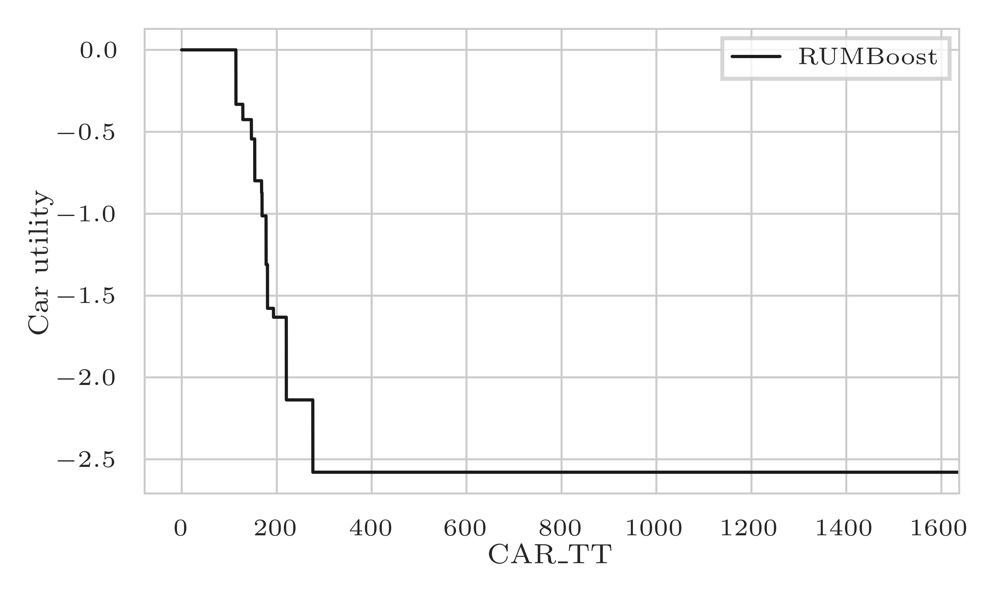

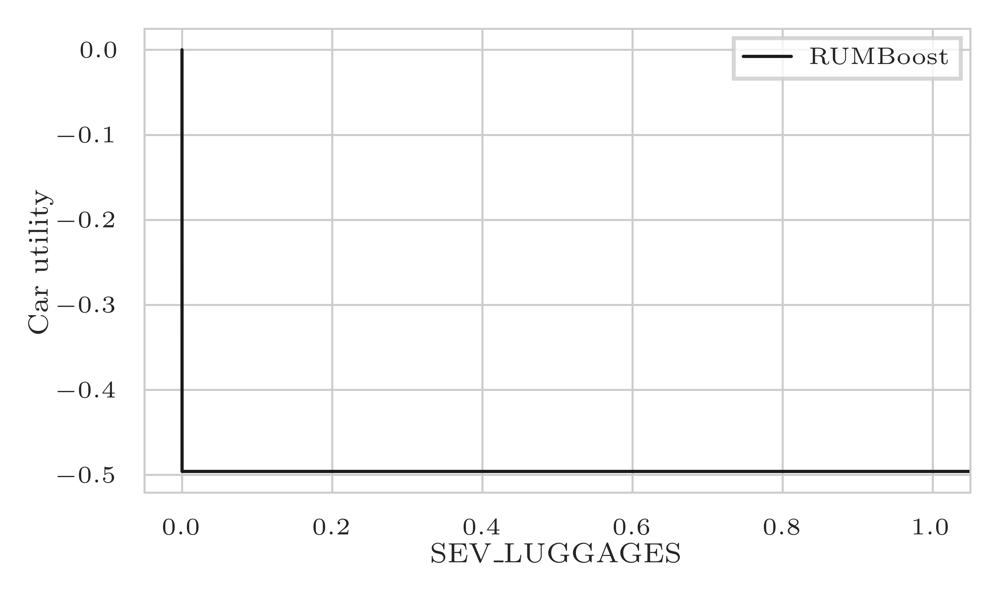

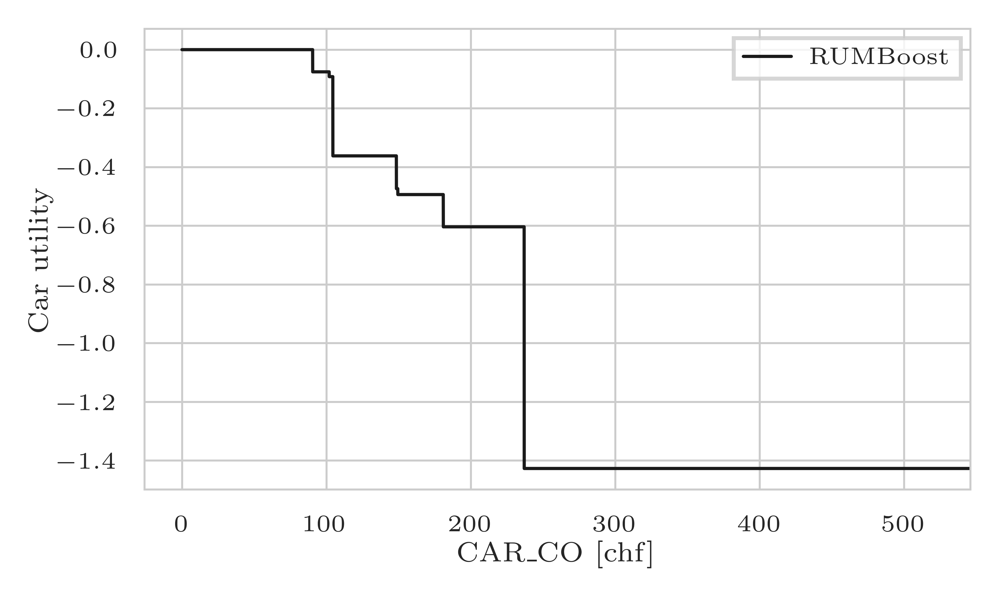

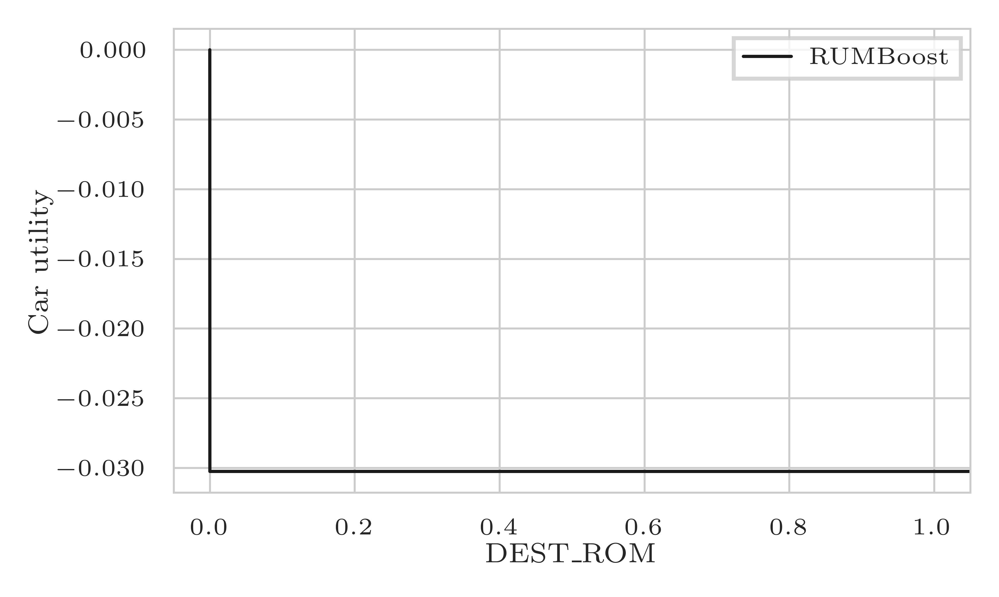

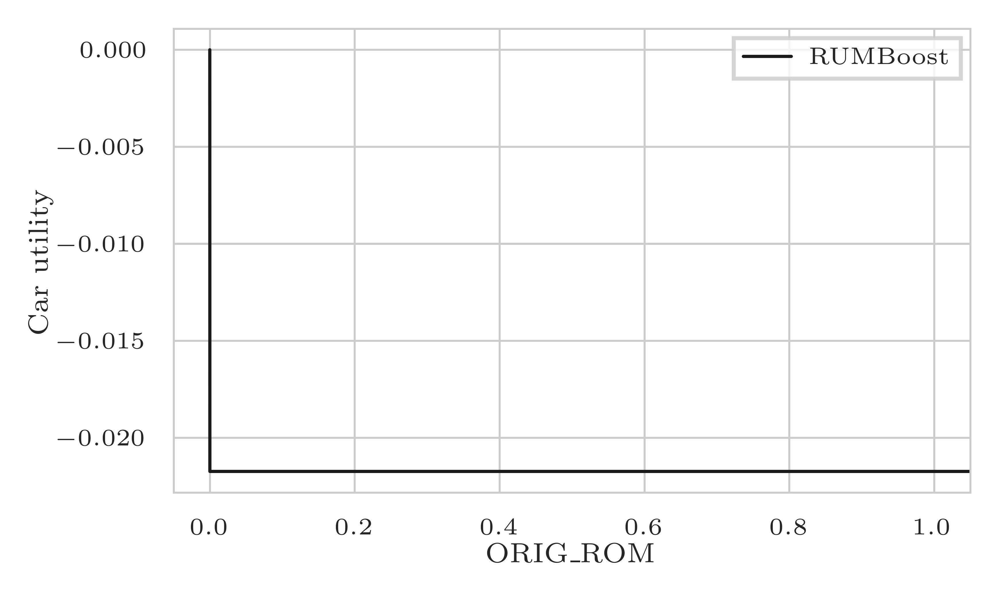

In [154]:
model = RUMBooster(model_file='Data/Results-RealDatasets/SwissMetro_RUMBoost_0.json')
params = {'verbosity': 1,
        'num_classes': 3,
        'learning_rate': 0.1,
        'max_depth': 1,
        'num_boost_round': 2000,
        'objective':'multiclass',
        'early_stopping_rounds': 100,
        'boosting': 'gbdt',
        'monotone_constraints_method': 'advanced'
        }

dataset_train, dataset_test = return_dataset([load_preprocess_SwissMetro])

utility_names = {'0':'Train', '1':'Swissmetro', '2':'Car'}
#utility_names = {'0':'Walking', '1':'Cycling', '2':'PT', '3':'Driving'}

model.plot_parameters(params = params, X=dataset_train[0], utility_names= utility_names, asc_normalised=True, sm_tt_cost=True, save_figure=True, only_tt=False, only_1d=True, save_file='RUMBoost/SwissMetro/')

# LPMC Splines, pop VOT, attributes VOT

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


c:\Users\DAF1\OneDrive - University College London\Documents\PhD - UCL\GBM feature extraction\Multiclass problem\function_smoothing.py:1346: UserWarning: linewidths is ignored by contourf
  c_plot = axes.contourf(X, Y, np.log(VoT_contour_plot)/np.log(10), levels=res, linewidths=0, cmap=sns.color_palette("Blues", as_cmap=True), vmin = -1, vmax = 2)


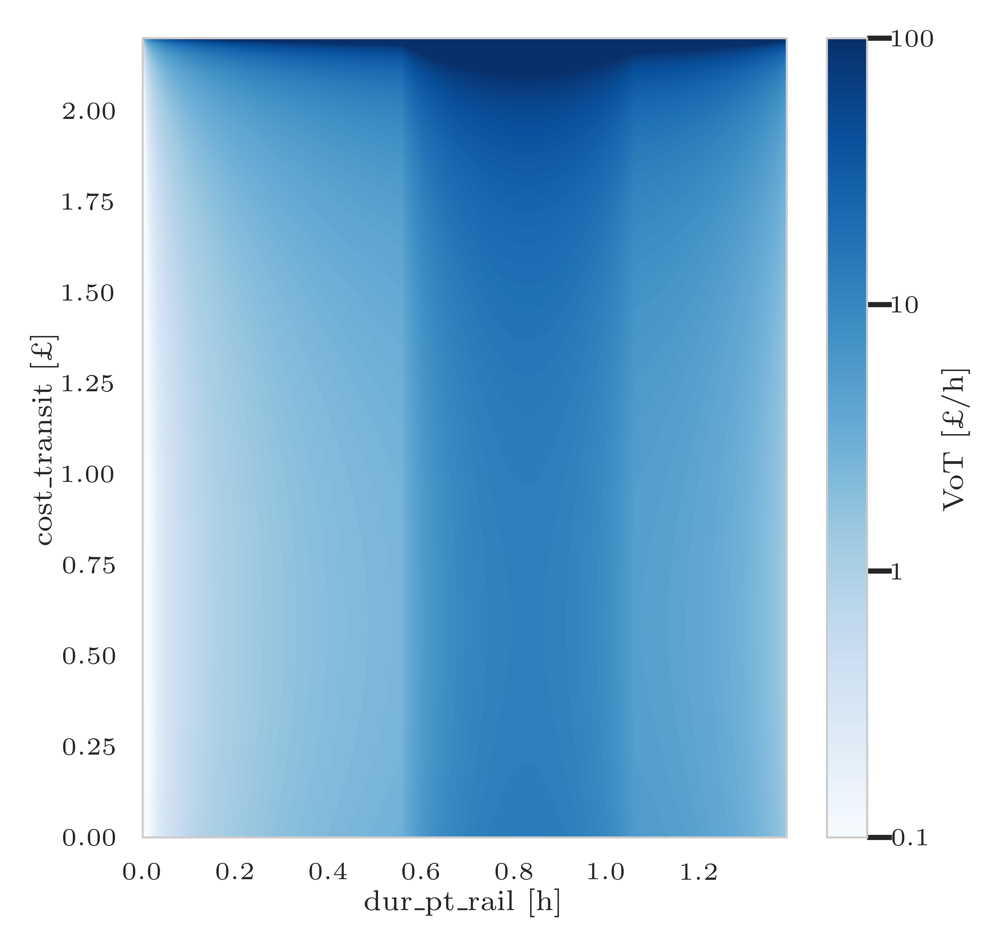

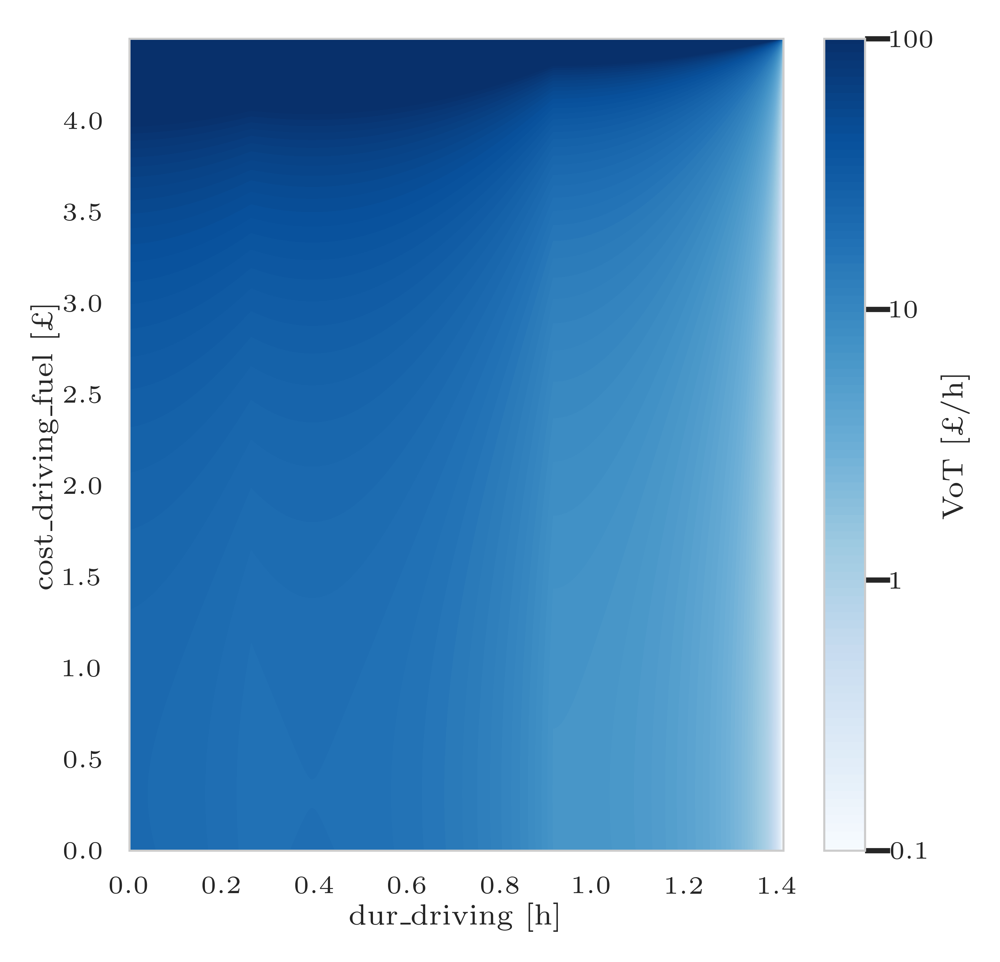

In [8]:
%load_ext autoreload
%autoreload 2
from function_smoothing import map_x_knots, updated_utility_collection, plot_VoT, plot_spline, plot_pop_VoT

dataset_train, dataset_test = return_dataset([load_preprocess_LPMC], to_return = 'split')
data_train = dataset_train[0].sample(frac=1, random_state=1)


model = RUMBooster(model_file='../Data/Results-RealDatasets/LPMC_RUMBoost.json')

weights = model.weights_to_plot_v2()
spline_utilities = {'0':['distance', 'dur_walking'],'1':['distance', 'dur_cycling'], '2':['dur_pt_rail', 'dur_pt_bus', 'cost_transit', 'dur_pt_int_waiting', 'dur_pt_int_walking', 'dur_pt_access'], '3': ['distance', 'dur_driving','cost_driving_fuel', 'driving_traffic_percent']}

target = 'choice'
features = [col for col in dataset_train[0].columns if col is not target]

spline_collection = {'0':{'distance':5, 'dur_walking':5},'1':{'distance':5, 'dur_cycling':5}, '2':{'cost_transit':2, 'dur_pt_access':3, 'dur_pt_bus':3, 'dur_pt_int_waiting':7, 'dur_pt_int_walking':6, 'dur_pt_rail':3}, '3': {'cost_driving_fuel':2, 'distance':3,'driving_traffic_percent':7, 'dur_driving':4}}

x_opt = [1.0805352,9.5892674,12.1871553,18.7756622,0.6841399,1.88031045,2.6049696,4.7469162,2.3434590,4.8489419,6.8959335,22.39515234,0.2461892,0.6483437,1.4011128,2.0150709,2.20294092,0.3819308,0.5251230,0.6283444,1.3068718,0.36636089,0.4597549,0.4902266,0.5230144,0.5645416,0.6003928,0.06062728,0.0700555,0.0918193,0.1073947,0.1386478,0.5565452,1.05661835,4.4533922,2.7690524,20.06629679,0.1420523,0.1891977,0.2826689,0.3887416,0.6787755,0.8662186,0.2619434,0.9124998,1.40968899]

x_first = [0.077, 0.025277778, 0.077, 0.006111111, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.077, 0.0, 0.000277778]
x_last = [40.941, 9.278333333, 40.941, 3.051944444, 13.2, 1.058611111, 2.147222222, 0.837222222, 0.179166667, 1.383333333, 10.09, 40.941, 1.25, 2.060833333]

x_knots_dict = map_x_knots(x_opt, spline_collection, x_first, x_last)

util_collection = updated_utility_collection(weights, dataset_train[0], spline_collection, spline_utilities, mean_splines=False, x_knots = x_knots_dict)


attribute_VoT =  {'2': ('dur_pt_rail', 'cost_transit'), '3':('dur_driving', 'cost_driving_fuel')}

draw_range = {'2':{'dur_pt_rail':(0,1.383), 'cost_transit':(0, 2.2)}, '3':{'dur_driving':(0, 1.409), 'cost_driving_fuel':(0, 4.45)}}

plot_VoT(dataset_train[0], util_collection, attribute_VoT, utility_names={'0': 'Walking', '1': 'Cycling', '2':'Rail', '3':'Driving'}, draw_range=draw_range, save_figure=True)

plot_spline(model, dataset_train[0], spline_collection, utility_names={'0': 'Walking', '1': 'Cycling', '2':'PT', '3':'Driving'}, x_knots_dict = x_knots_dict, save_fig=True, lpmc_tt_cost=True, save_file='Figures/RUMBoost/LPMC/')

plot_pop_VoT(dataset_test[0], util_collection, attribute_VoT, save_figure=True)

# Functional Effect model: Individual specific plots

In [173]:
%load_ext autoreload
%autoreload 2

from rumbooster import RUMBooster
from utils import split_mixed_model, bio_to_rumboost
import lightgbm as lgb
import numpy as np
from benchmarks import prepare_model
from models import LPMC

dataset_train, dataset_test = return_dataset([load_preprocess_LPMC], to_return = 'split')

models_train = prepare_model([LPMC], dataset_train)
rnd_effects_attributes = ['age', 'female', 'start_time_linear', 'day_of_week', 'car_ownership', 'driving_license', 'purpose_B', 'purpose_HBE', 'purpose_HBO', 'purpose_HBW', 'purpose_NHBO', 'fueltype_Average', 'fueltype_Diesel', 'fueltype_Hybrid', 'fueltype_Petrol']

target = 'choice'
train_data = lgb.Dataset(dataset_train[0], label=dataset_train[0][target], free_raw_data=False)

validate_data = lgb.Dataset(dataset_test[0], label=dataset_test[0][target], free_raw_data=False)

model_trained_nest = RUMBooster(model_file='../Data/Results-RealDatasets/LPMC_RUMBoost_Full_Effect.json')
model_trained_nest.random_effects = True
model_trained_nest.rum_structure = bio_to_rumboost(models_train[0], rnd_effect_attributes=rnd_effects_attributes)

fixeff_model, rdeff_model = split_mixed_model(model_trained_nest)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


[[<Axes: > <Axes: >]
 [<Axes: > <Axes: >]]


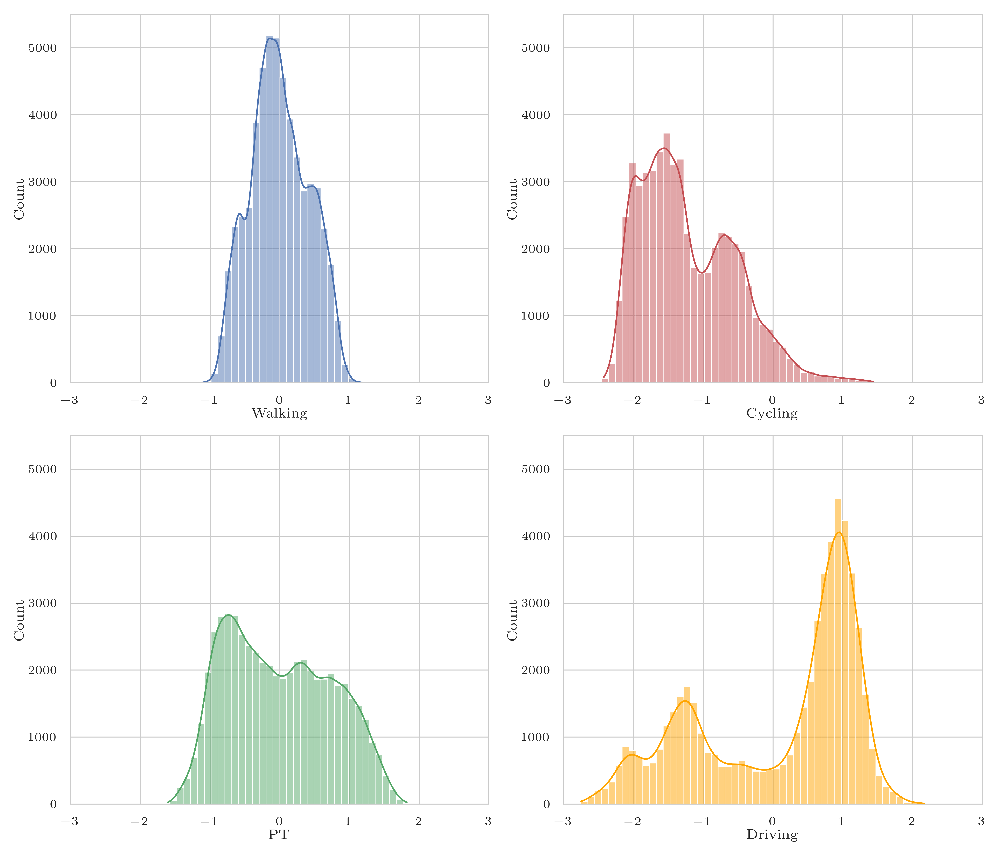

In [174]:
Random_effects = rdeff_model.predict(lgb.Dataset(dataset_train[0], label=dataset_train[0]['choice'], free_raw_data=False), utilities=True)
name = ['Walking', 'Cycling', 'PT', 'Driving']
import matplotlib.pyplot as plt
import seaborn as sns
bins=np.histogram(Random_effects, bins=50)[1]
tex_fonts = {
        # Use LaTeX to write all text
        "text.usetex": True, 
        "font.family": "serif",
        "font.serif": "Computer Modern Roman",
        # Use 14pt font in plots, to match 10pt font in document
        "axes.labelsize": 7,
        "axes.linewidth":0.5,
        "axes.labelpad": 1,
        "font.size": 7,
        # Make the legend/label fonts a little smaller
        "legend.fontsize": 6,
        "legend.fancybox": False,
        "legend.edgecolor": "inherit",
        'legend.borderaxespad': 0.4,
        'legend.borderpad': 0.4,
        "xtick.labelsize": 6,
        "ytick.labelsize": 6,
        "xtick.major.pad": 0.5,
        "ytick.major.pad": 0.5,
        "grid.linewidth": 0.5,
        "lines.linewidth": 0.8
    }
sns.set_theme(font_scale=1, rc=tex_fonts)
#sns.set_context(tex_fonts)
sns.set_style("whitegrid")
plt.rcParams.update({
    "text.usetex": True,
    "font.family": "serif"
    #"font.sans-serif": "Computer Modern Roman",
})
f, axes = plt.subplots(2, 2, figsize=(7, 6), tight_layout=True, dpi = 1000)
colors = ['b', 'r', 'g', 'orange']
print(axes)
sns.histplot(Random_effects[:, 0], bins=bins, alpha=0.5, ax=axes[0, 0], kde=True, color=colors[0])
axes[0, 0].set_xlabel(f'{name[0]}')

sns.histplot(Random_effects[:, 1], bins=bins, alpha=0.5, ax=axes[0, 1], kde=True, color=colors[1])
axes[0, 1].set_xlabel(f'{name[1]}')

sns.histplot(Random_effects[:, 2], bins=bins, alpha=0.5, ax=axes[1, 0], kde=True, color=colors[2])
axes[1, 0].set_xlabel(f'{name[2]}')

sns.histplot(Random_effects[:, 3], bins=bins, alpha=0.5, ax=axes[1, 1], kde=True, color=colors[3])
axes[1, 1].set_xlabel(f'{name[3]}')

# Defining custom 'xlim' and 'ylim' values.
custom_xlim = (-3, 3)
custom_ylim = (0, 5500)

# Setting the values for all axes.
plt.setp(axes, xlim=custom_xlim, ylim=custom_ylim)

plt.show()

# Functional Effect: Conditional individual specific plot

In [3]:
%load_ext autoreload
%autoreload 2

from benchmarks import return_dataset
from datasets import load_preprocess_LPMC, load_preprocess_SwissMetro
from rumbooster import RUMBooster
from utils import split_mixed_model, bio_to_rumboost
import lightgbm as lgb
import numpy as np
from benchmarks import prepare_model
from models import LPMC

dataset_train, dataset_test = return_dataset([load_preprocess_LPMC], to_return = 'split')

models_train = prepare_model([LPMC], dataset_train)
rnd_effects_attributes = ['age', 'female', 'start_time_linear', 'day_of_week', 'car_ownership', 'driving_license', 'purpose_B', 'purpose_HBE', 'purpose_HBO', 'purpose_HBW', 'purpose_NHBO', 'fueltype_Average', 'fueltype_Diesel', 'fueltype_Hybrid', 'fueltype_Petrol']

target = 'choice'
train_data = lgb.Dataset(dataset_train[0], label=dataset_train[0][target], free_raw_data=False)

validate_data = lgb.Dataset(dataset_test[0], label=dataset_test[0][target], free_raw_data=False)

model_trained_nest = RUMBooster(model_file='../Data/Results-RealDatasets/LPMC_RUMBoost_Full_Effect.json')
model_trained_nest.random_effects = True
model_trained_nest.rum_structure = bio_to_rumboost(models_train[0], rnd_effect_attributes=rnd_effects_attributes)

fixeff_model, rdeff_model = split_mixed_model(model_trained_nest)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


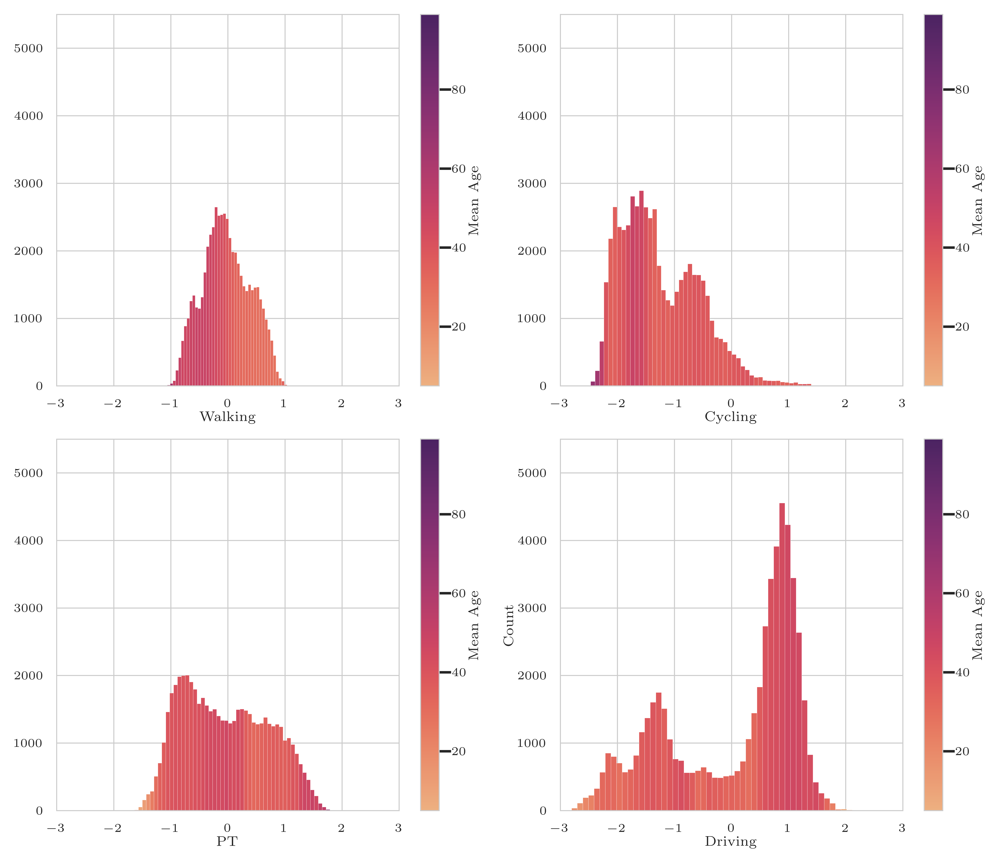

In [6]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable

Random_effects = rdeff_model.predict(lgb.Dataset(dataset_train[0], label=dataset_train[0]['choice'], free_raw_data=False), utilities=True)
names = ['Walking', 'Cycling', 'PT', 'Driving']

bins=np.histogram(Random_effects, bins=50)[1]
tex_fonts = {
        # Use LaTeX to write all text
        "text.usetex": True, 
        "font.family": "serif",
        "font.serif": "Computer Modern Roman",
        # Use 14pt font in plots, to match 10pt font in document
        "axes.labelsize": 7,
        "axes.linewidth":0.5,
        "axes.labelpad": 1,
        "font.size": 7,
        # Make the legend/label fonts a little smaller
        "legend.fontsize": 6,
        "legend.fancybox": False,
        "legend.edgecolor": "inherit",
        'legend.borderaxespad': 0.4,
        'legend.borderpad': 0.4,
        "xtick.labelsize": 6,
        "ytick.labelsize": 6,
        "xtick.major.pad": 0.5,
        "ytick.major.pad": 0.5,
        "grid.linewidth": 0.5,
        "lines.linewidth": 0.8
    }

sns.set_theme(font_scale=1, rc=tex_fonts)
#sns.set_context(tex_fonts)
sns.set_style("whitegrid")
plt.rcParams.update({
    "text.usetex": True,
    "font.family": "serif"
    #"font.sans-serif": "Computer Modern Roman",
})

colors = ['Blues', 'Reds', 'Greens', 'Oranges']
f, axes = plt.subplots(2, 2, figsize=(7, 6), tight_layout=True, dpi = 1000)

axes = axes.flatten()



for j, name in enumerate(names):
    # Step 1: Compute histogram bins and bin indices for the data
    data = Random_effects[:, j]  # Example for the first mode of transport

    bins = np.histogram_bin_edges(data, bins=50)
    bin_indices = np.digitize(data, bins) - 1  # -1 to convert to 0-based indexing
    age_data = dataset_train[0]['age'].values
    mean_ages = np.array([age_data[bin_indices == i].mean() for i in range(len(bins)-1)])
    # Step 2: Calculate mean age for each bin


    # Step 3: Create a colormap based on the mean ages
    norm = Normalize(vmin=dataset_train[0]['age'].min(), vmax=dataset_train[0]['age'].max())
    cmap = sns.color_palette("flare", as_cmap=True)
    sm = ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])  # You have to set the array for the ScalarMappable

    # Step 4: Plot bars for each bin with colors based on mean age
    for i in range(len(bins)-1):
        axes[j].bar(x=bins[i], height=np.histogram(data, bins=bins)[0][i], width=bins[i+1]-bins[i], color=cmap(norm(mean_ages[i])), alpha=1, linewidth=0.1)

    plt.colorbar(sm, ax=axes[j], label='Mean Age')

    # Step 5: Adjust plot aesthetics
    axes[j].set_xlabel(f'{name}')
    plt.ylabel('Count')
    #plt.title('Histogram of Random Effects Colored by Mean Age')

# Defining custom 'xlim' and 'ylim' values.
custom_xlim = (-3, 3)
custom_ylim = (0, 5500)

# Setting the values for all axes.
plt.setp(axes, xlim=custom_xlim, ylim=custom_ylim)

plt.show()

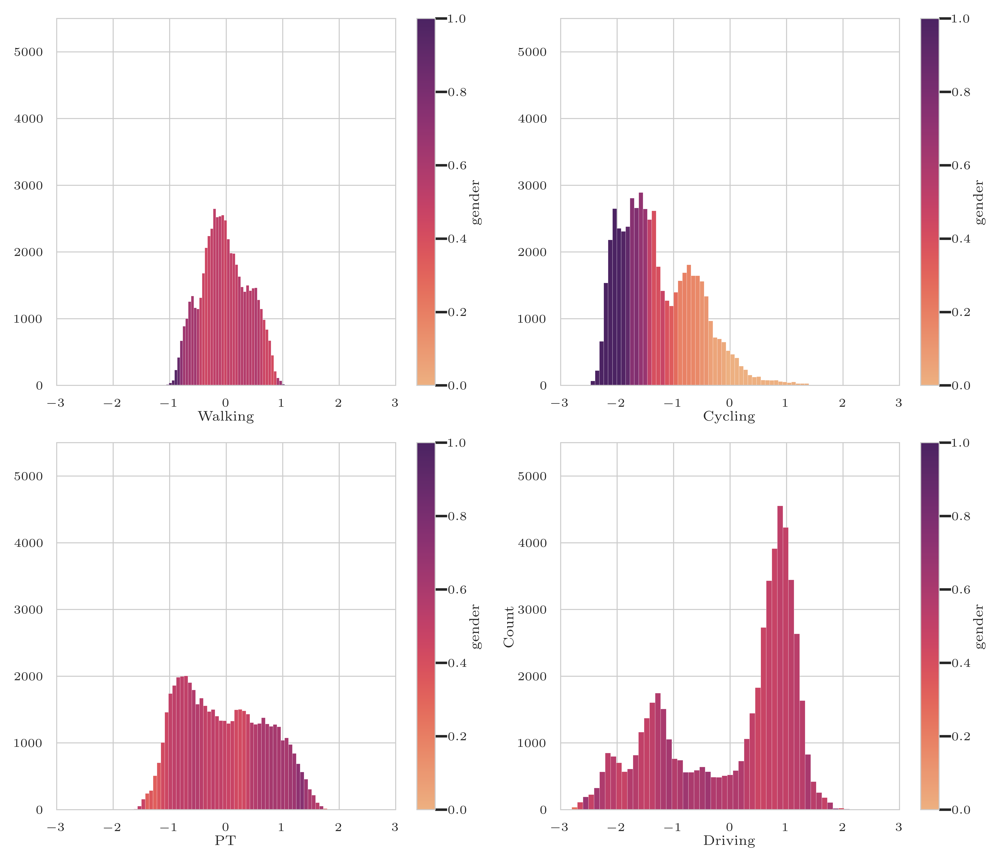

In [10]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable

Random_effects = rdeff_model.predict(lgb.Dataset(dataset_train[0], label=dataset_train[0]['choice'], free_raw_data=False), utilities=True)
names = ['Walking', 'Cycling', 'PT', 'Driving']

bins=np.histogram(Random_effects, bins=50)[1]
tex_fonts = {
        # Use LaTeX to write all text
        "text.usetex": True, 
        "font.family": "serif",
        "font.serif": "Computer Modern Roman",
        # Use 14pt font in plots, to match 10pt font in document
        "axes.labelsize": 7,
        "axes.linewidth":0.5,
        "axes.labelpad": 1,
        "font.size": 7,
        # Make the legend/label fonts a little smaller
        "legend.fontsize": 6,
        "legend.fancybox": False,
        "legend.edgecolor": "inherit",
        'legend.borderaxespad': 0.4,
        'legend.borderpad': 0.4,
        "xtick.labelsize": 6,
        "ytick.labelsize": 6,
        "xtick.major.pad": 0.5,
        "ytick.major.pad": 0.5,
        "grid.linewidth": 0.5,
        "lines.linewidth": 0.8
    }

sns.set_theme(font_scale=1, rc=tex_fonts)
#sns.set_context(tex_fonts)
sns.set_style("whitegrid")
plt.rcParams.update({
    "text.usetex": True,
    "font.family": "serif"
    #"font.sans-serif": "Computer Modern Roman",
})

colors = ['Blues', 'Reds', 'Greens', 'Oranges']
f, axes = plt.subplots(2, 2, figsize=(7, 6), tight_layout=True, dpi = 1000)

axes = axes.flatten()



for j, name in enumerate(names):
    # Step 1: Compute histogram bins and bin indices for the data
    data = Random_effects[:, j]  # Example for the first mode of transport

    bins = np.histogram_bin_edges(data, bins=50)
    bin_indices = np.digitize(data, bins) - 1  # -1 to convert to 0-based indexing
    age_data = dataset_train[0]['female'].values
    mean_ages = np.array([age_data[bin_indices == i].mean() for i in range(len(bins)-1)])
    # Step 2: Calculate mean age for each bin


    # Step 3: Create a colormap based on the mean ages
    norm = Normalize(vmin=dataset_train[0]['female'].min(), vmax=dataset_train[0]['female'].max())
    cmap = sns.color_palette("flare", as_cmap=True)
    sm = ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])  # You have to set the array for the ScalarMappable

    # Step 4: Plot bars for each bin with colors based on mean age
    for i in range(len(bins)-1):
        axes[j].bar(x=bins[i], height=np.histogram(data, bins=bins)[0][i], width=bins[i+1]-bins[i], color=cmap(norm(mean_ages[i])), alpha=1, linewidth=0.1)

    plt.colorbar(sm, ax=axes[j], label='gender')

    # Step 5: Adjust plot aesthetics
    axes[j].set_xlabel(f'{name}')
    plt.ylabel('Count')
    #plt.title('Histogram of Random Effects Colored by Mean Age')

# Defining custom 'xlim' and 'ylim' values.
custom_xlim = (-3, 3)
custom_ylim = (0, 5500)

# Setting the values for all axes.
plt.setp(axes, xlim=custom_xlim, ylim=custom_ylim)

plt.show()

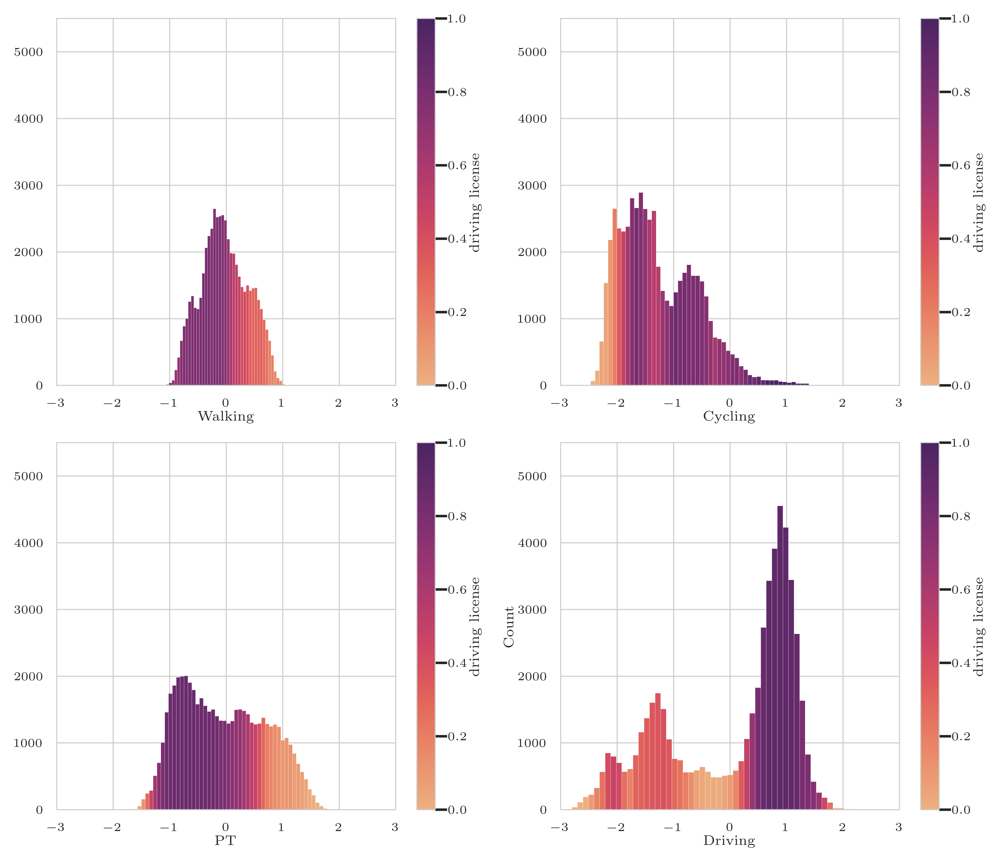

In [16]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable

Random_effects = rdeff_model.predict(lgb.Dataset(dataset_train[0], label=dataset_train[0]['choice'], free_raw_data=False), utilities=True)
names = ['Walking', 'Cycling', 'PT', 'Driving']

bins=np.histogram(Random_effects, bins=50)[1]
tex_fonts = {
        # Use LaTeX to write all text
        "text.usetex": True, 
        "font.family": "serif",
        "font.serif": "Computer Modern Roman",
        # Use 14pt font in plots, to match 10pt font in document
        "axes.labelsize": 7,
        "axes.linewidth":0.5,
        "axes.labelpad": 1,
        "font.size": 7,
        # Make the legend/label fonts a little smaller
        "legend.fontsize": 6,
        "legend.fancybox": False,
        "legend.edgecolor": "inherit",
        'legend.borderaxespad': 0.4,
        'legend.borderpad': 0.4,
        "xtick.labelsize": 6,
        "ytick.labelsize": 6,
        "xtick.major.pad": 0.5,
        "ytick.major.pad": 0.5,
        "grid.linewidth": 0.5,
        "lines.linewidth": 0.8
    }

sns.set_theme(font_scale=1, rc=tex_fonts)
#sns.set_context(tex_fonts)
sns.set_style("whitegrid")
plt.rcParams.update({
    "text.usetex": True,
    "font.family": "serif"
    #"font.sans-serif": "Computer Modern Roman",
})

colors = ['Blues', 'Reds', 'Greens', 'Oranges']
f, axes = plt.subplots(2, 2, figsize=(7, 6), tight_layout=True, dpi = 1000)

axes = axes.flatten()



for j, name in enumerate(names):
    # Step 1: Compute histogram bins and bin indices for the data
    data = Random_effects[:, j]  # Example for the first mode of transport

    bins = np.histogram_bin_edges(data, bins=50)
    bin_indices = np.digitize(data, bins) - 1  # -1 to convert to 0-based indexing
    age_data = dataset_train[0]['driving_license'].values
    mean_ages = np.array([age_data[bin_indices == i].mean() for i in range(len(bins)-1)])
    # Step 2: Calculate mean age for each bin


    # Step 3: Create a colormap based on the mean ages
    norm = Normalize(vmin=dataset_train[0]['driving_license'].min(), vmax=dataset_train[0]['driving_license'].max())
    cmap = sns.color_palette("flare", as_cmap=True)
    sm = ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])  # You have to set the array for the ScalarMappable

    # Step 4: Plot bars for each bin with colors based on mean age
    for i in range(len(bins)-1):
        axes[j].bar(x=bins[i], height=np.histogram(data, bins=bins)[0][i], width=bins[i+1]-bins[i], color=cmap(norm(mean_ages[i])), alpha=1, linewidth=0.1)

    plt.colorbar(sm, ax=axes[j], label='driving license')

    # Step 5: Adjust plot aesthetics
    axes[j].set_xlabel(f'{name}')
    plt.ylabel('Count')
    #plt.title('Histogram of Random Effects Colored by Mean Age')

# Defining custom 'xlim' and 'ylim' values.
custom_xlim = (-3, 3)
custom_ylim = (0, 5500)

# Setting the values for all axes.
plt.setp(axes, xlim=custom_xlim, ylim=custom_ylim)

plt.show()

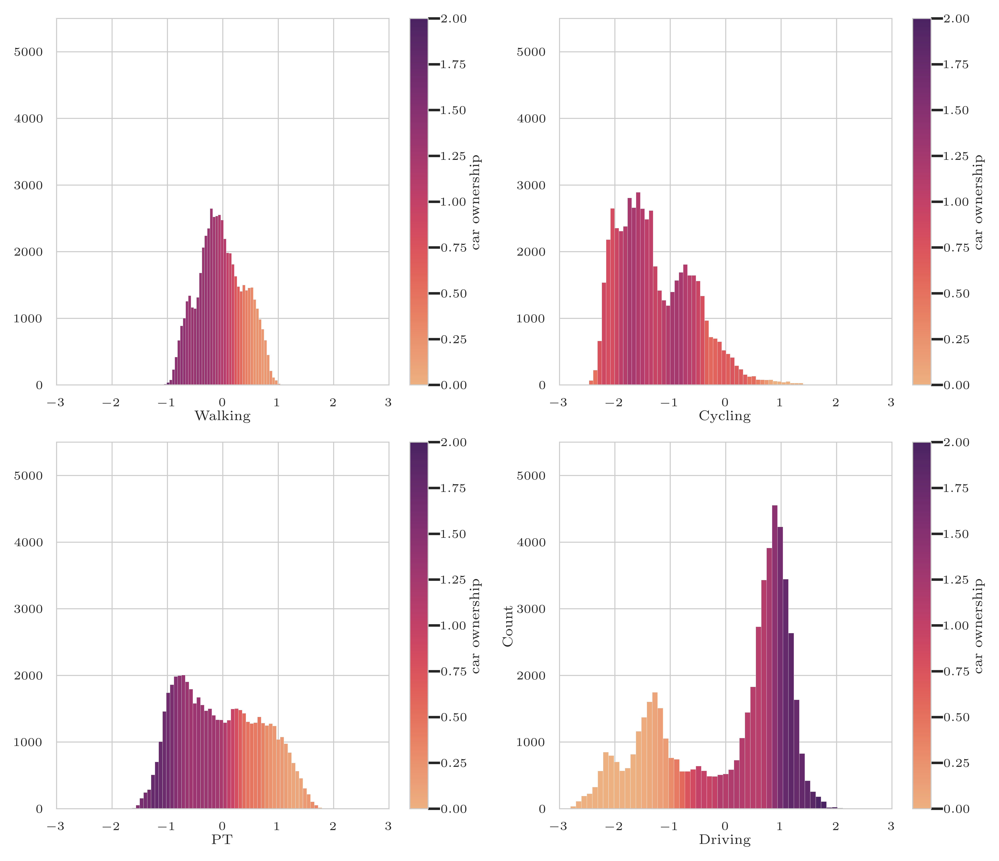

In [13]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable

Random_effects = rdeff_model.predict(lgb.Dataset(dataset_train[0], label=dataset_train[0]['choice'], free_raw_data=False), utilities=True)
names = ['Walking', 'Cycling', 'PT', 'Driving']

bins=np.histogram(Random_effects, bins=50)[1]
tex_fonts = {
        # Use LaTeX to write all text
        "text.usetex": True, 
        "font.family": "serif",
        "font.serif": "Computer Modern Roman",
        # Use 14pt font in plots, to match 10pt font in document
        "axes.labelsize": 7,
        "axes.linewidth":0.5,
        "axes.labelpad": 1,
        "font.size": 7,
        # Make the legend/label fonts a little smaller
        "legend.fontsize": 6,
        "legend.fancybox": False,
        "legend.edgecolor": "inherit",
        'legend.borderaxespad': 0.4,
        'legend.borderpad': 0.4,
        "xtick.labelsize": 6,
        "ytick.labelsize": 6,
        "xtick.major.pad": 0.5,
        "ytick.major.pad": 0.5,
        "grid.linewidth": 0.5,
        "lines.linewidth": 0.8
    }

sns.set_theme(font_scale=1, rc=tex_fonts)
#sns.set_context(tex_fonts)
sns.set_style("whitegrid")
plt.rcParams.update({
    "text.usetex": True,
    "font.family": "serif"
    #"font.sans-serif": "Computer Modern Roman",
})

colors = ['Blues', 'Reds', 'Greens', 'Oranges']
f, axes = plt.subplots(2, 2, figsize=(7, 6), tight_layout=True, dpi = 1000)

axes = axes.flatten()



for j, name in enumerate(names):
    # Step 1: Compute histogram bins and bin indices for the data
    data = Random_effects[:, j]  # Example for the first mode of transport

    bins = np.histogram_bin_edges(data, bins=50)
    bin_indices = np.digitize(data, bins) - 1  # -1 to convert to 0-based indexing
    age_data = dataset_train[0]['car_ownership'].values
    mean_ages = np.array([age_data[bin_indices == i].mean() for i in range(len(bins)-1)])
    # Step 2: Calculate mean age for each bin


    # Step 3: Create a colormap based on the mean ages
    norm = Normalize(vmin=dataset_train[0]['car_ownership'].min(), vmax=dataset_train[0]['car_ownership'].max())
    cmap = sns.color_palette("flare", as_cmap=True)
    sm = ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])  # You have to set the array for the ScalarMappable

    # Step 4: Plot bars for each bin with colors based on mean age
    for i in range(len(bins)-1):
        axes[j].bar(x=bins[i], height=np.histogram(data, bins=bins)[0][i], width=bins[i+1]-bins[i], color=cmap(norm(mean_ages[i])), alpha=1, linewidth=0.1)

    plt.colorbar(sm, ax=axes[j], label='car ownership')

    # Step 5: Adjust plot aesthetics
    axes[j].set_xlabel(f'{name}')
    plt.ylabel('Count')
    #plt.title('Histogram of Random Effects Colored by Mean Age')

# Defining custom 'xlim' and 'ylim' values.
custom_xlim = (-3, 3)
custom_ylim = (0, 5500)

# Setting the values for all axes.
plt.setp(axes, xlim=custom_xlim, ylim=custom_ylim)

plt.show()

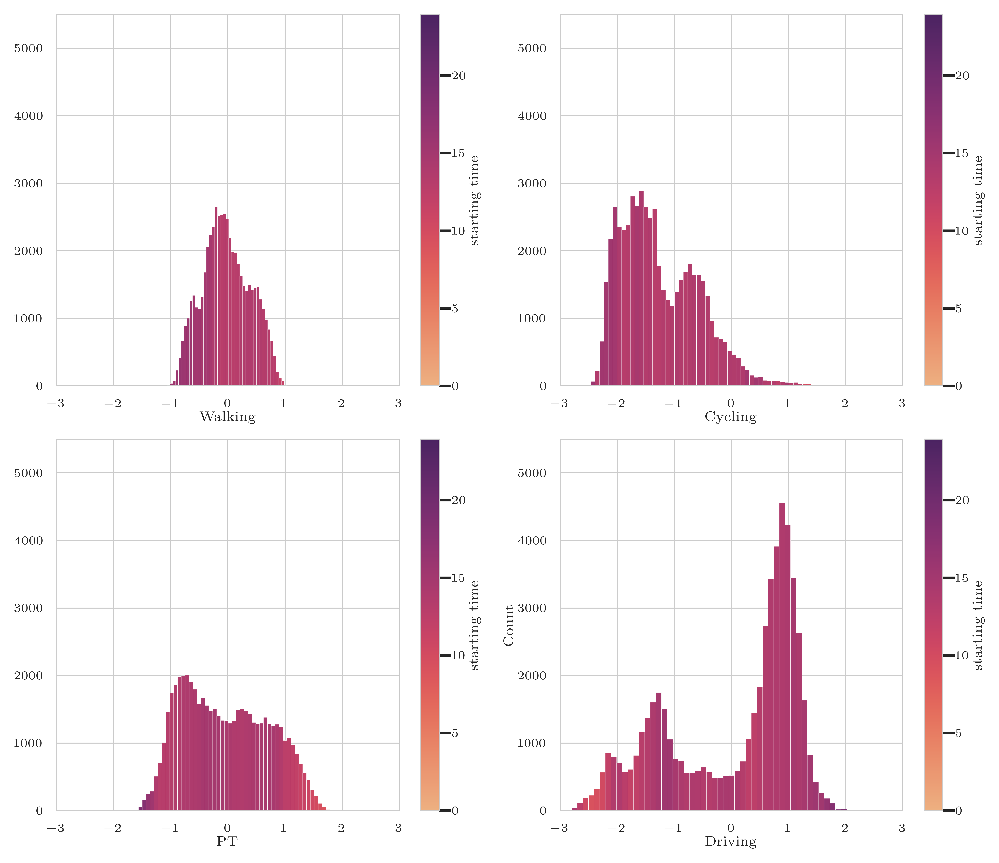

In [14]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable

Random_effects = rdeff_model.predict(lgb.Dataset(dataset_train[0], label=dataset_train[0]['choice'], free_raw_data=False), utilities=True)
names = ['Walking', 'Cycling', 'PT', 'Driving']

bins=np.histogram(Random_effects, bins=50)[1]
tex_fonts = {
        # Use LaTeX to write all text
        "text.usetex": True, 
        "font.family": "serif",
        "font.serif": "Computer Modern Roman",
        # Use 14pt font in plots, to match 10pt font in document
        "axes.labelsize": 7,
        "axes.linewidth":0.5,
        "axes.labelpad": 1,
        "font.size": 7,
        # Make the legend/label fonts a little smaller
        "legend.fontsize": 6,
        "legend.fancybox": False,
        "legend.edgecolor": "inherit",
        'legend.borderaxespad': 0.4,
        'legend.borderpad': 0.4,
        "xtick.labelsize": 6,
        "ytick.labelsize": 6,
        "xtick.major.pad": 0.5,
        "ytick.major.pad": 0.5,
        "grid.linewidth": 0.5,
        "lines.linewidth": 0.8
    }

sns.set_theme(font_scale=1, rc=tex_fonts)
#sns.set_context(tex_fonts)
sns.set_style("whitegrid")
plt.rcParams.update({
    "text.usetex": True,
    "font.family": "serif"
    #"font.sans-serif": "Computer Modern Roman",
})

colors = ['Blues', 'Reds', 'Greens', 'Oranges']
f, axes = plt.subplots(2, 2, figsize=(7, 6), tight_layout=True, dpi = 1000)

axes = axes.flatten()



for j, name in enumerate(names):
    # Step 1: Compute histogram bins and bin indices for the data
    data = Random_effects[:, j]  # Example for the first mode of transport

    bins = np.histogram_bin_edges(data, bins=50)
    bin_indices = np.digitize(data, bins) - 1  # -1 to convert to 0-based indexing
    age_data = dataset_train[0]['start_time_linear'].values
    mean_ages = np.array([age_data[bin_indices == i].mean() for i in range(len(bins)-1)])
    # Step 2: Calculate mean age for each bin


    # Step 3: Create a colormap based on the mean ages
    norm = Normalize(vmin=dataset_train[0]['start_time_linear'].min(), vmax=dataset_train[0]['start_time_linear'].max())
    cmap = sns.color_palette("flare", as_cmap=True)
    sm = ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])  # You have to set the array for the ScalarMappable

    # Step 4: Plot bars for each bin with colors based on mean age
    for i in range(len(bins)-1):
        axes[j].bar(x=bins[i], height=np.histogram(data, bins=bins)[0][i], width=bins[i+1]-bins[i], color=cmap(norm(mean_ages[i])), alpha=1, linewidth=0.1)

    plt.colorbar(sm, ax=axes[j], label='starting time')

    # Step 5: Adjust plot aesthetics
    axes[j].set_xlabel(f'{name}')
    plt.ylabel('Count')
    #plt.title('Histogram of Random Effects Colored by Mean Age')

# Defining custom 'xlim' and 'ylim' values.
custom_xlim = (-3, 3)
custom_ylim = (0, 5500)

# Setting the values for all axes.
plt.setp(axes, xlim=custom_xlim, ylim=custom_ylim)

plt.show()

# Feature Interaction : LPMC Age and travel time

c:\Users\DAF1\OneDrive - University College London\Documents\PhD - UCL\GBM feature extraction\Multiclass problem\rumbooster.py:1134: UserWarning: linewidths is ignored by contourf
  c_plot = axes.contourf(X, Y, contour_plot.T, levels=res, linewidths=0, cmap=customPalette, vmin=-15, vmax=0)
c:\Users\DAF1\OneDrive - University College London\Documents\PhD - UCL\GBM feature extraction\Multiclass problem\rumbooster.py:1134: UserWarning: linewidths is ignored by contourf
  c_plot = axes.contourf(X, Y, contour_plot.T, levels=res, linewidths=0, cmap=customPalette, vmin=-15, vmax=0)
c:\Users\DAF1\OneDrive - University College London\Documents\PhD - UCL\GBM feature extraction\Multiclass problem\rumbooster.py:1134: UserWarning: linewidths is ignored by contourf
  c_plot = axes.contourf(X, Y, contour_plot.T, levels=res, linewidths=0, cmap=customPalette, vmin=-15, vmax=0)
c:\Users\DAF1\OneDrive - University College London\Documents\PhD - UCL\GBM feature extraction\Multiclass problem\rumbooster.py:

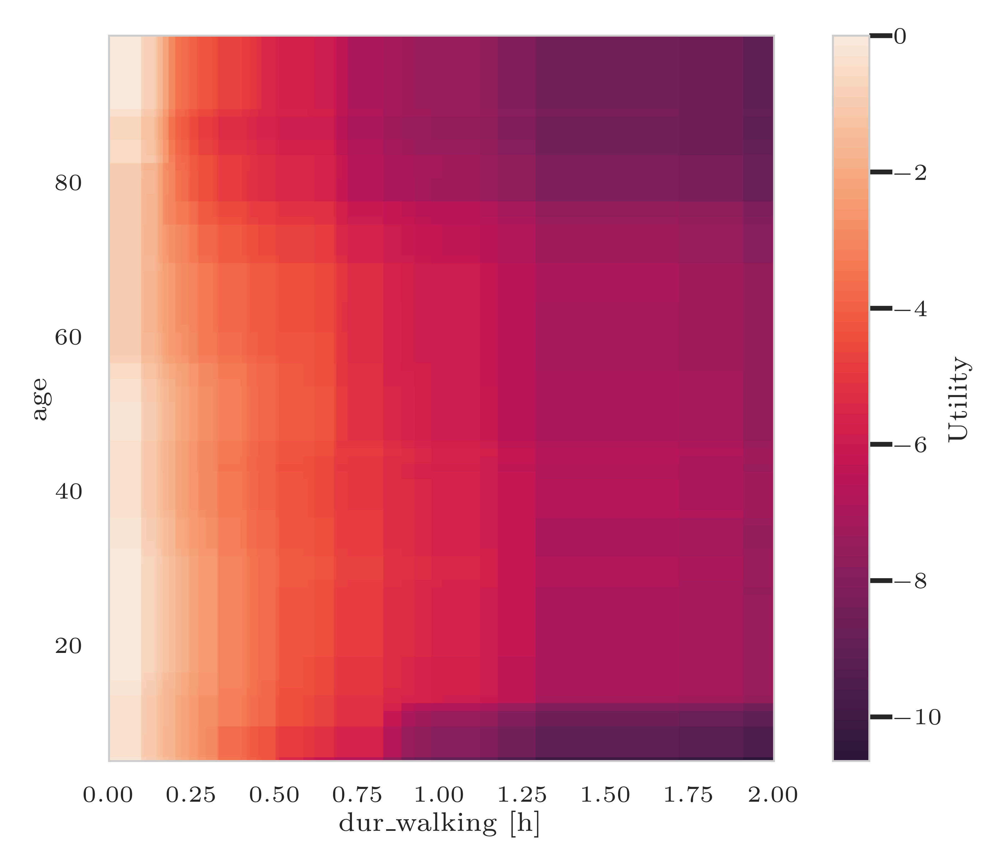

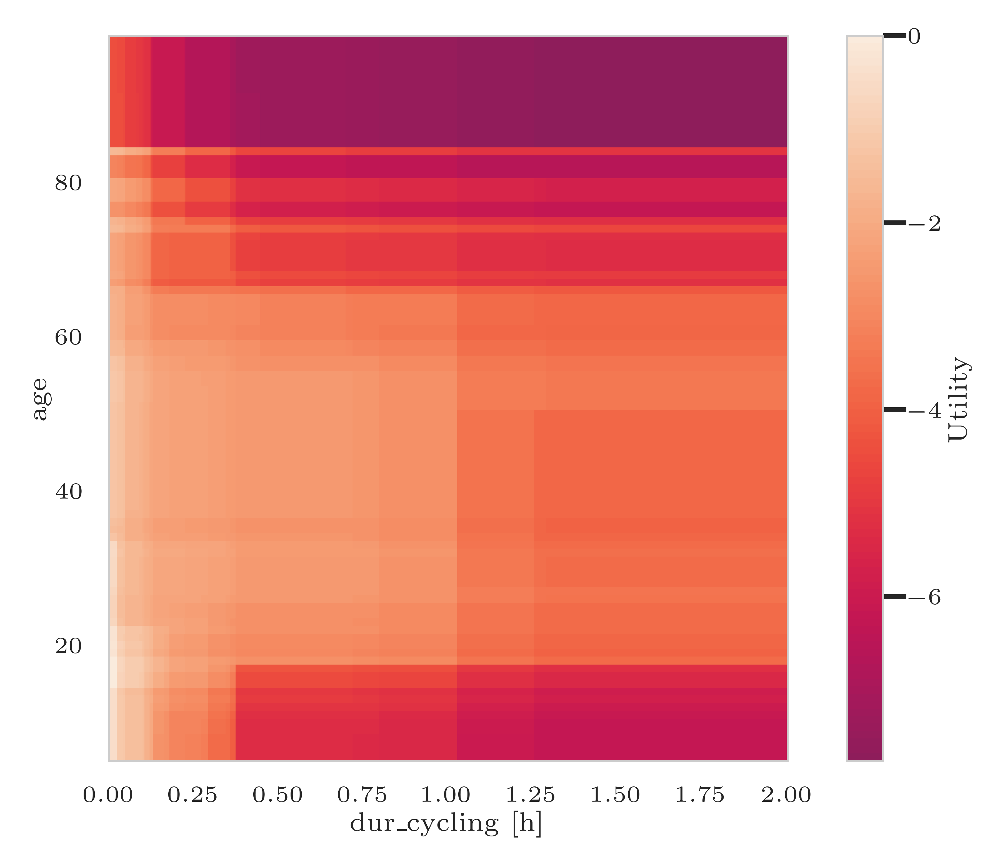

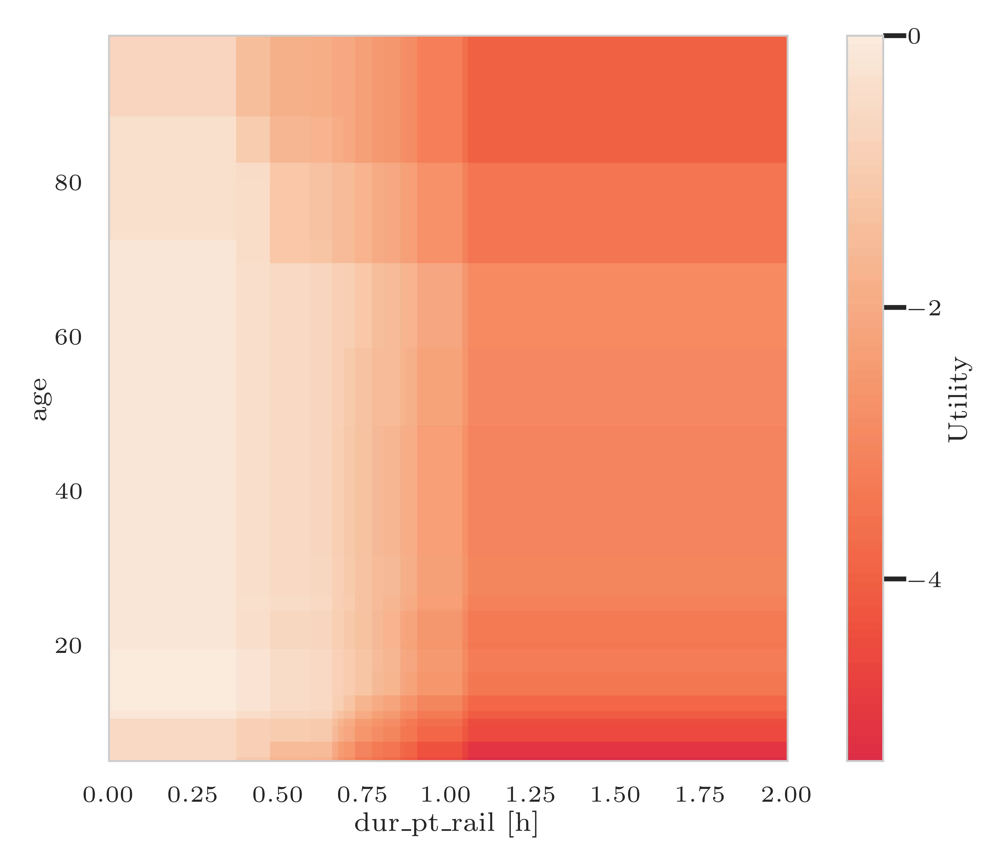

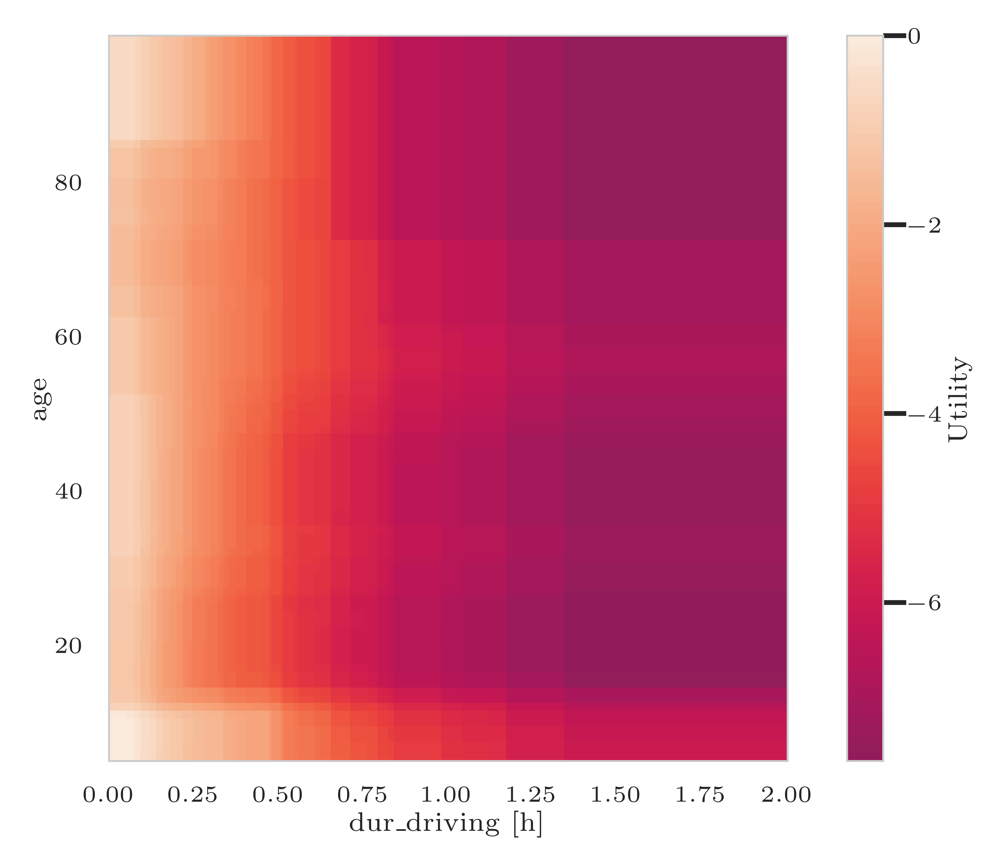

In [177]:
dataset_train, dataset_test = return_dataset([load_preprocess_LPMC], to_return = 'split')

model_LPMC = RUMBooster(model_file='../Data/Results-RealDatasets/LPMC_RUMBoost_FI.json')

utility_names={'0': 'Walking', '1': 'Cycling', '2':'PT', '3':'Driving'}

model_LPMC.plot_2d('dur_walking', 'age', 0, 2, dataset_train[0]['age'].min(), dataset_train[0]['age'].max(), num_points=10000, model = None, save_figure=True)
model_LPMC.plot_2d('dur_cycling', 'age', 0, 2, dataset_train[0]['age'].min(), dataset_train[0]['age'].max(), num_points=10000, model = None, save_figure=True)
model_LPMC.plot_2d('dur_pt_rail', 'age', 0, 2, dataset_train[0]['age'].min(), dataset_train[0]['age'].max(), num_points=10000, model = None, save_figure=True)
model_LPMC.plot_2d('dur_driving', 'age', 0, 2, dataset_train[0]['age'].min(), dataset_train[0]['age'].max(), num_points=10000, model = None, save_figure=True)

# Feature Interaction : LPMC Age and travel time (alternative plot)

c:\Users\DAF1\OneDrive - University College London\Documents\PhD - UCL\GBM feature extraction\Multiclass problem\rumbooster.py:1267: UserWarning: linewidths is ignored by contourf
  


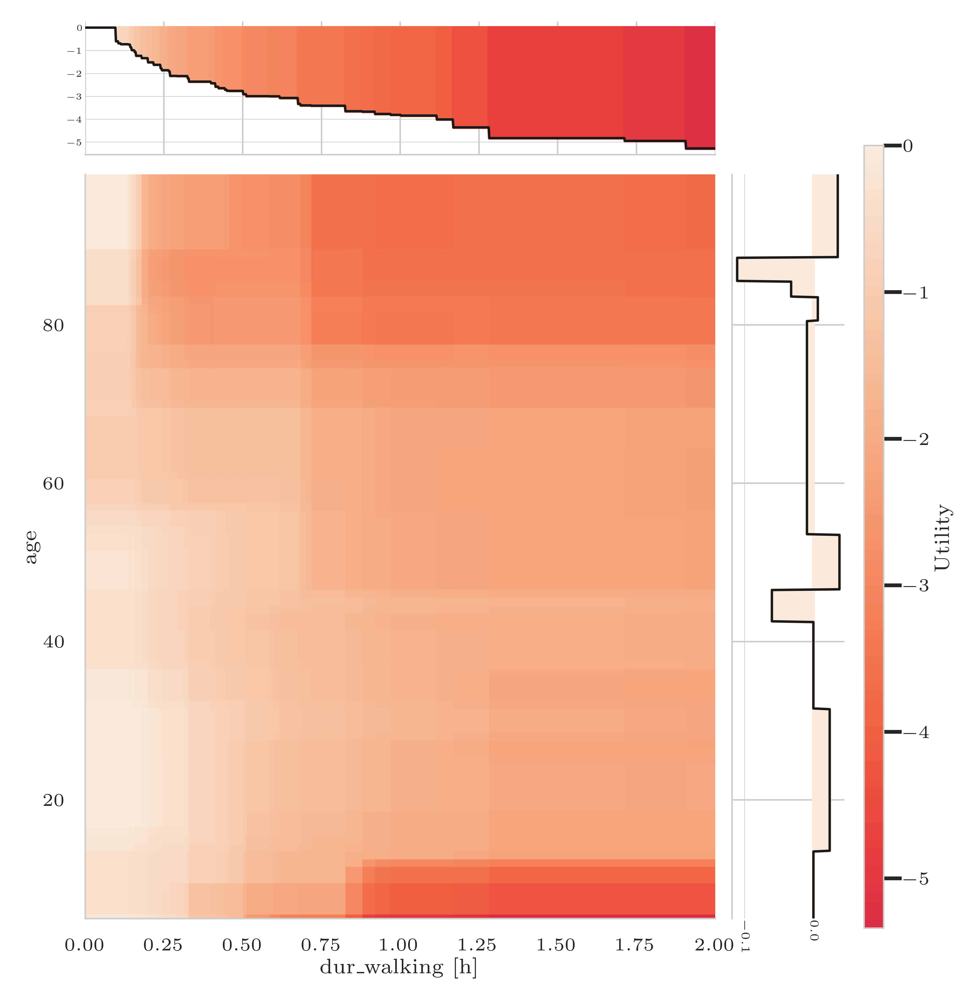

c:\Users\DAF1\OneDrive - University College London\Documents\PhD - UCL\GBM feature extraction\Multiclass problem\rumbooster.py:1267: UserWarning: linewidths is ignored by contourf
  


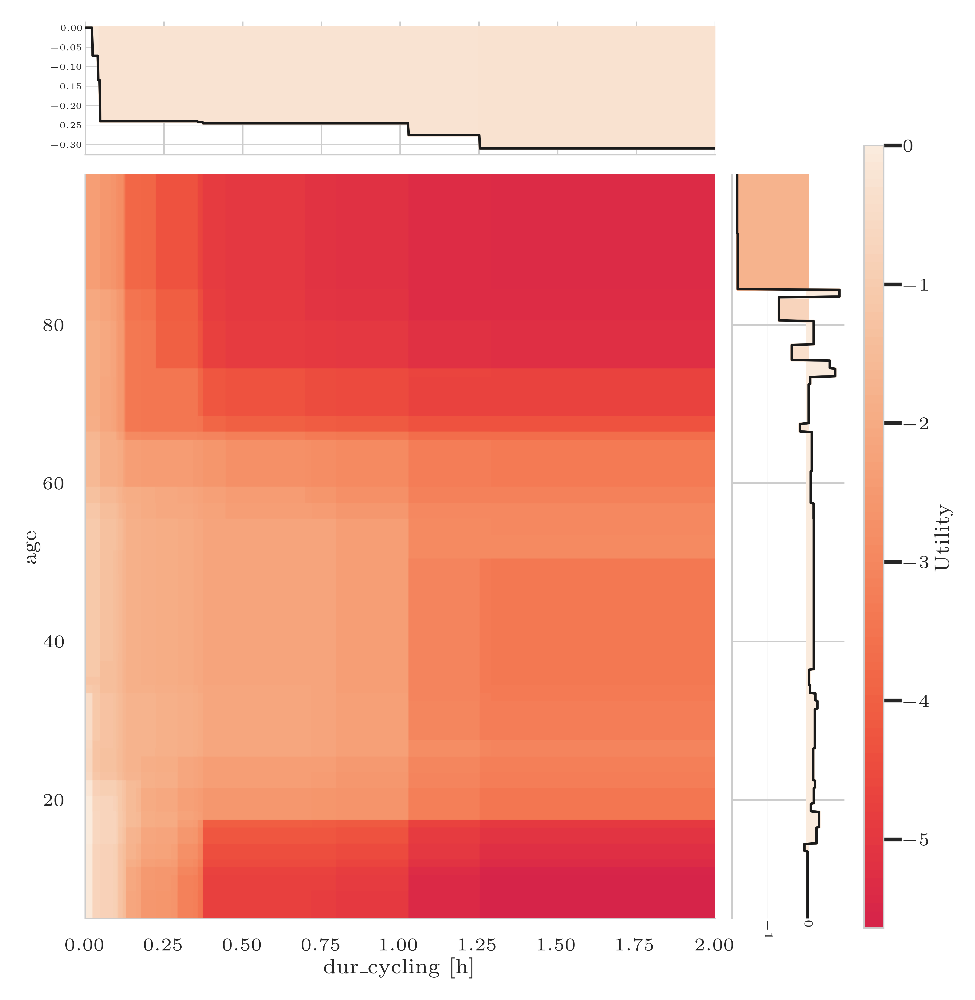

c:\Users\DAF1\OneDrive - University College London\Documents\PhD - UCL\GBM feature extraction\Multiclass problem\rumbooster.py:1267: UserWarning: linewidths is ignored by contourf
  


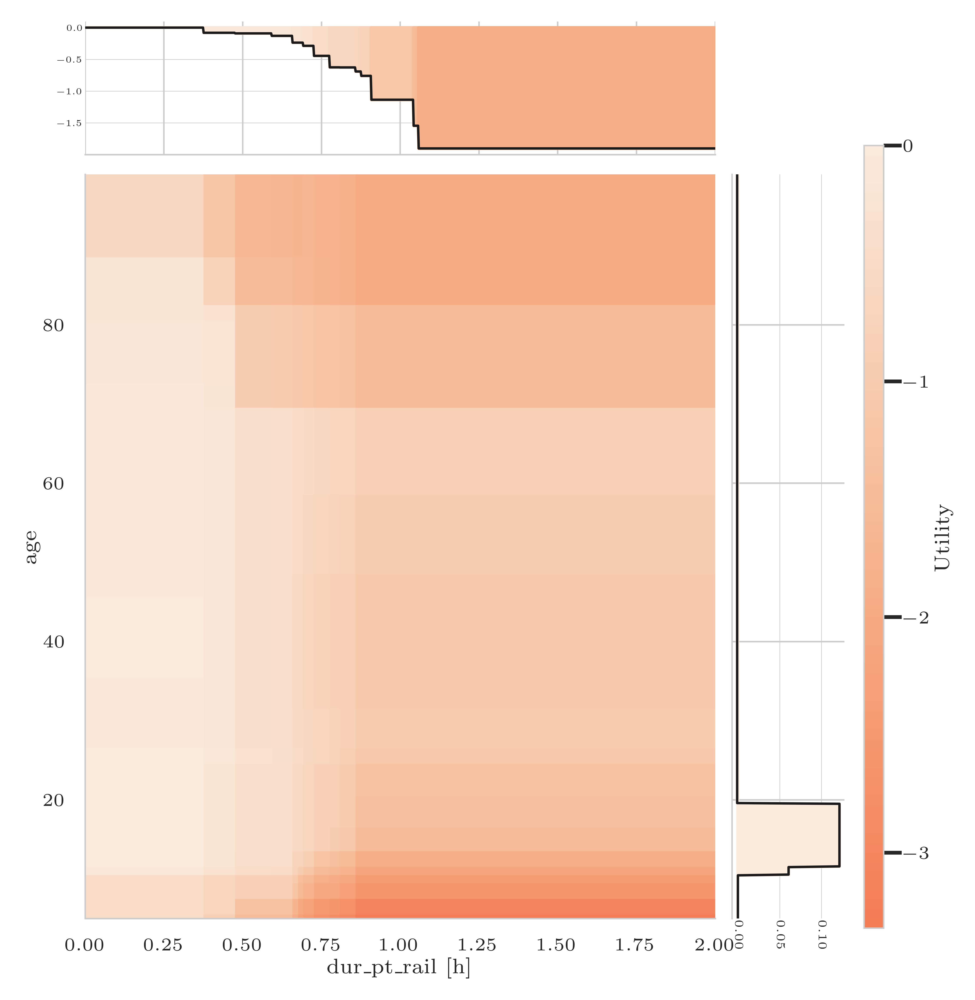

c:\Users\DAF1\OneDrive - University College London\Documents\PhD - UCL\GBM feature extraction\Multiclass problem\rumbooster.py:1267: UserWarning: linewidths is ignored by contourf
  


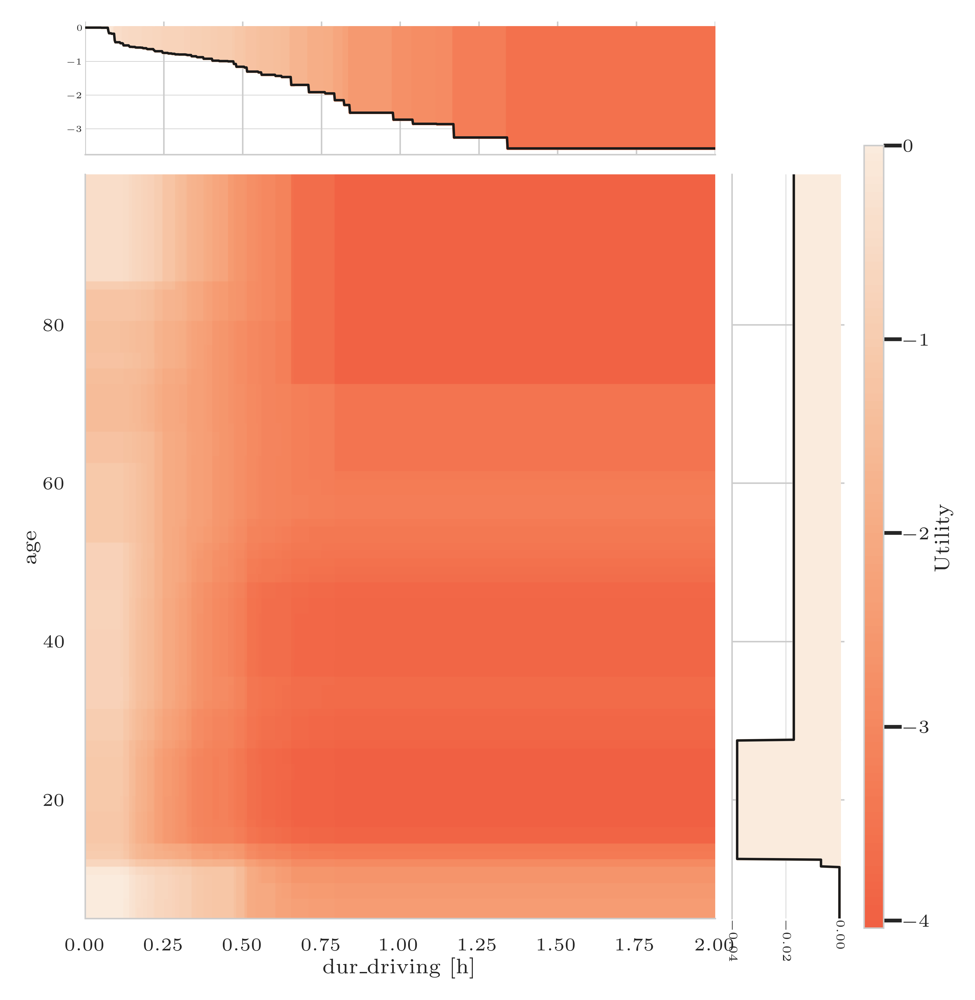

In [51]:
dataset_train, dataset_test = return_dataset([load_preprocess_LPMC], to_return = 'split')

model_LPMC = RUMBooster(model_file='../Data/Results-RealDatasets/LPMC_RUMBoost_FI.json')

utility_names={'0': 'Walking', '1': 'Cycling', '2':'PT', '3':'Driving'}

model_LPMC.plot_2d_detailed('dur_walking', 'age', 0, 2, dataset_train[0]['age'].min(), dataset_train[0]['age'].max(), num_points=1000, model = None, save_figure=True)
model_LPMC.plot_2d_detailed('dur_cycling', 'age', 0, 2, dataset_train[0]['age'].min(), dataset_train[0]['age'].max(), num_points=1000, model = None, save_figure=True)
model_LPMC.plot_2d_detailed('dur_pt_rail', 'age', 0, 2, dataset_train[0]['age'].min(), dataset_train[0]['age'].max(), num_points=1000, model = None, save_figure=True)
model_LPMC.plot_2d_detailed('dur_driving', 'age', 0, 2, dataset_train[0]['age'].min(), dataset_train[0]['age'].max(), num_points=1000, model = None, save_figure=True)